In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Define paths
path_potential = r'c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models'
path_np = r'c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\3_Test_AlternativePreprocessing'

# Models to include from 1_Potential_Models (Original)
models_potential = [
    'baseline_algo',
    'tcn_model_fine_tune_mb_pool',
    'tcn_model_mb_precompute_pool_adam',
    'tcn_model_mb_precompute_pool'
]

# Models to include from 3_Test_AlternativePreprocessing (NP)
models_np = [
    'newpreprocess_tcn_model_fine_tune_mb_pool',
    'newpreprocess_tcn_model_mb_precompute_pool_adam',
    'newpreprocess_tcn_model_mb_precompute_pool_adam_ln',
    'newpreprocess_tcn_model_mb_precompute_pool_sgd'
]

sources = [
    {
        'path': path_potential,
        'filter': lambda f: any(m in f for m in models_potential),
        'suffix': '' 
    },
    {
        'path': path_np,
        'filter': lambda f: any(m in f for m in models_np),
        'suffix': ' + NP'
    }
]
datasets = ['Reddit', 'Twitter']

def get_model_info(folder_name, suffix=''):
    """
    Extracts Model Name, Group, and Optimizer from the folder name.
    """
    # Determine Optimizer
    is_adam = 'adam' in folder_name.lower()
    optimizer = 'Adam' if is_adam else 'SGD'
    
    # Determine Model Name and Group
    if 'baseline_algo' in folder_name:
        name = 'Baseline (AL-BTCN)'
        group = 'Baseline'
    else:
        name = 'MentalBERT '
        if 'pool' in folder_name:
            name += 'Pool'
        elif 'seqOut' in folder_name:
            name += 'Seq'
        else:
            name += 'Unknown'
            
        group = 'Fine-Tuning' if 'fine_tune' in folder_name else 'Precomputed'
        name = f"{name} ({group})"
    
    # Append Optimizer only if Adam
    if is_adam:
        name += " - Adam"
        
    # Append Suffix (e.g., + NP)
    name += suffix

    # Check for LN (specifically for NP folder which has LN model)
    if '_ln' in folder_name.lower():
        name += ' + LN'
    
    return name, group, optimizer

all_data = []

for source in sources:
    base_path = source['path']
    filter_func = source['filter']
    suffix = source['suffix']
    
    for dataset in datasets:
        dataset_path = os.path.join(base_path, dataset)
        if not os.path.exists(dataset_path):
            print(f"Dataset path not found: {dataset_path}")
            continue
            
        # List all folders
        folders = [f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))]
        
        for folder in folders:
            # Filter for 10S folders (10 seeds)
            if not folder.startswith('10S'):
                continue
                
            # Apply source-specific filter
            if not filter_func(folder):
                continue
                
            # Construct file path to the all_folds excel file
            file_path = os.path.join(dataset_path, folder, f"{folder}_all_folds.xlsx")
            
            if os.path.exists(file_path):
                print(f"Processing {file_path}...")
                try:
                    # Read all sheets (each sheet is a seed)
                    sheets = pd.read_excel(file_path, sheet_name=None)
                    
                    # Concatenate all sheets
                    df = pd.concat(sheets.values(), ignore_index=True)
                    
                    # Get metadata
                    model_name, model_group, optimizer = get_model_info(folder, suffix)
                    
                    df['Model Name'] = model_name
                    df['Model Group'] = model_group
                    df['Optimizer'] = optimizer
                    df['Dataset'] = dataset
                    df['Source Folder'] = folder
                    
                    all_data.append(df)
                except Exception as e:
                    print(f"Error reading {file_path}: {e}")
            else:
                print(f"File not found: {file_path}")

if all_data:
    full_df = pd.concat(all_data, ignore_index=True)
    print("Data loaded successfully.")
    print(full_df.head())
    print(full_df.groupby(['Dataset', 'Model Name', 'Optimizer']).size())
else:
    print("No data loaded.")

Processing c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models\Reddit\10SR_baseline_algo\10SR_baseline_algo_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models\Reddit\10SR_tcn_model_fine_tune_mb_pool\10SR_tcn_model_fine_tune_mb_pool_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models\Reddit\10SR_tcn_model_mb_precompute_pool\10SR_tcn_model_mb_precompute_pool_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models\Reddit\10SR_tcn_model_mb_precompute_pool_adam\10SR_tcn_model_mb_precompute_pool_adam_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models\Twitter\10ST_baseline_algo\10ST_baseline_algo_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\1_Potential_Models\Twitter\10ST_tcn_model_fine_tune_mb_pool\10ST_tcn_model_fine_tune_mb_pool_all_fold

In [2]:
# Define Plotting Functions

def plot_combined_barchart(df, metric, order=None):
    """
    Plots a combined bar chart for both datasets (Side-by-Side).
    """
    if df.empty: return

    # Determine if higher is better
    higher_is_better = 'Time' not in metric and 'Memory' not in metric and 'Epochs' not in metric
    
    # Metrics to exclude from group-wise bolding
    exclude_from_group_bolding = ['Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 'Epochs Run', 'Avg Time/Epoch (s)']
    use_group_bolding = metric not in exclude_from_group_bolding

    g = sns.catplot(
        data=df,
        kind="bar",
        x="Model Name",
        y=metric,
        col="Dataset",
        col_order=['Twitter', 'Reddit'],
        height=6,
        aspect=1.5,
        order=order,
        errorbar='sd',
        capsize=.1,
        sharey=False # Allow different scales for different datasets
    )
    
    g.fig.suptitle(f'{metric} Comparison (Bar Chart)', y=1.05, fontsize=16)
    g.set_xticklabels(rotation=45, ha='right')
    g.set_axis_labels("Model", metric)
    
    col_order = ['Twitter', 'Reddit']
    
    # Annotate
    for ax, dataset_name in zip(g.axes.flat, col_order):
        dataset_df = df[df['Dataset'] == dataset_name]
        if dataset_df.empty: continue
        
        best_models = []
        
        if use_group_bolding:
            # Find best in 'Precomputed' and 'Fine-Tuning' groups
            if 'Model Group' in dataset_df.columns:
                for group in ['Precomputed', 'Fine-Tuning']:
                    group_df = dataset_df[dataset_df['Model Group'] == group]
                    if group_df.empty: continue
                    
                    means = group_df.groupby('Model Name')[metric].mean()
                    if means.empty: continue
                    
                    if higher_is_better:
                        best_model = means.idxmax()
                    else:
                        best_model = means.idxmin()
                    best_models.append(best_model)
            else:
                 # Fallback if Model Group is missing
                 means = dataset_df.groupby('Model Name')[metric].mean()
                 if not means.empty:
                    if higher_is_better:
                        best_models.append(means.idxmax())
                    else:
                        best_models.append(means.idxmin())
        else:
            # Original logic: global best
            means = dataset_df.groupby('Model Name')[metric].mean()
            if not means.empty:
                if higher_is_better:
                    best_models.append(means.idxmax())
                else:
                    best_models.append(means.idxmin())
        
        # Set Y-Limits
        y_min = dataset_df[metric].min()
        y_max = dataset_df[metric].max()
        y_range = y_max - y_min
        
        lower_ylim = y_min - y_range * 0.2
        if not higher_is_better and 'Accuracy' not in metric and 'F1' not in metric:
             lower_ylim = max(0, lower_ylim)
        if 'Accuracy' in metric or 'F1' in metric:
             lower_ylim = max(0, y_min - 0.05)

        upper_ylim = y_max + y_range * 0.2
        ax.set_ylim(lower_ylim, upper_ylim)

        # Add text and Color
        # Get patches
        patches = ax.patches
        
        if order:
            x_models = order
        else:
            x_models = sorted(dataset_df['Model Name'].unique())
            
        for i, patch in enumerate(patches):
            if i >= len(x_models):
                continue
                
            model_name = x_models[i]
            
            subset = dataset_df[dataset_df['Model Name'] == model_name]
            
            if not subset.empty:
                # Determine Color
                model_group = subset['Model Group'].iloc[0] if 'Model Group' in subset.columns else 'Unknown'
                
                color = '#7f7f7f' # Default grey (Baseline)
                if dataset_name == 'Twitter':
                    if model_group == 'Fine-Tuning': color = '#1f77b4' # Blue
                    elif model_group == 'Precomputed': color = '#aec7e8' # Light Blue
                elif dataset_name == 'Reddit':
                    if model_group == 'Fine-Tuning': color = '#d62728' # Red
                    elif model_group == 'Precomputed': color = '#ff9896' # Light Red
                
                patch.set_facecolor(color)

                mean_val = subset[metric].mean()
                std_val = subset[metric].std()
                
                x = patch.get_x() + patch.get_width() / 2
                y = patch.get_height() # This is the mean value
                
                text = f"{mean_val:.4f}\n±{std_val:.4f}"
                
                is_best = (model_name in best_models)
                font_weight = 'bold' if is_best else 'normal'
                
                # Position text above the error bar (approx)
                text_y = mean_val + std_val + (upper_ylim - lower_ylim)*0.02
                
                ax.text(
                    x, 
                    text_y, 
                    text, 
                    ha='center', 
                    va='bottom', 
                    fontsize=8, 
                    color='black',
                    fontweight=font_weight
                )
                
                if is_best:
                    for label in ax.get_xticklabels():
                        if label.get_text() == model_name:
                            label.set_fontweight('bold')

    plt.show()

def plot_combined_boxplot(df, metric, order=None):
    """
    Plots a combined box plot for both datasets.
    """
    if df.empty: return

    g = sns.catplot(
        data=df, 
        kind="box",
        x="Model Name", 
        y=metric, 
        col="Dataset",
        col_order=['Twitter', 'Reddit'],
        sharey=False,
        order=order,
        height=6,
        aspect=2
    )
    g.fig.suptitle(f'{metric} Distribution (Box Plot)', y=1.05, fontsize=16)
    g.set_xticklabels(rotation=45, ha='right')
    g.set_axis_labels("Model", metric)
    
    col_order = ['Twitter', 'Reddit']
    
    # Apply colors and add points
    for ax, dataset_name in zip(g.axes.flat, col_order):
        dataset_df = df[df['Dataset'] == dataset_name]
        if dataset_df.empty: continue
        
        # Add points
        sns.stripplot(
            data=dataset_df,
            x="Model Name",
            y=metric,
            order=order,
            color='black',
            alpha=0.5,
            jitter=True,
            ax=ax
        )
        
        # Get x-axis labels to ensure correct mapping
        x_models = [label.get_text() for label in ax.get_xticklabels()]
        
        # In seaborn boxplot, the boxes are in ax.artists or ax.patches depending on version
        boxes = ax.artists if ax.artists else ax.patches
        
        for i, box in enumerate(boxes):
            if i >= len(x_models):
                continue
                
            model_name = x_models[i]
            subset = dataset_df[dataset_df['Model Name'] == model_name]
            
            if not subset.empty:
                # Determine Color
                model_group = subset['Model Group'].iloc[0] if 'Model Group' in subset.columns else 'Unknown'
                
                color = '#7f7f7f' # Default grey (Baseline)
                if dataset_name == 'Twitter':
                    if model_group == 'Fine-Tuning': color = '#1f77b4' # Blue
                    elif model_group == 'Precomputed': color = '#aec7e8' # Light Blue
                elif dataset_name == 'Reddit':
                    if model_group == 'Fine-Tuning': color = '#d62728' # Red
                    elif model_group == 'Precomputed': color = '#ff9896' # Light Red
                
                box.set_facecolor(color)
    
    plt.show()

=== Accuracy ===


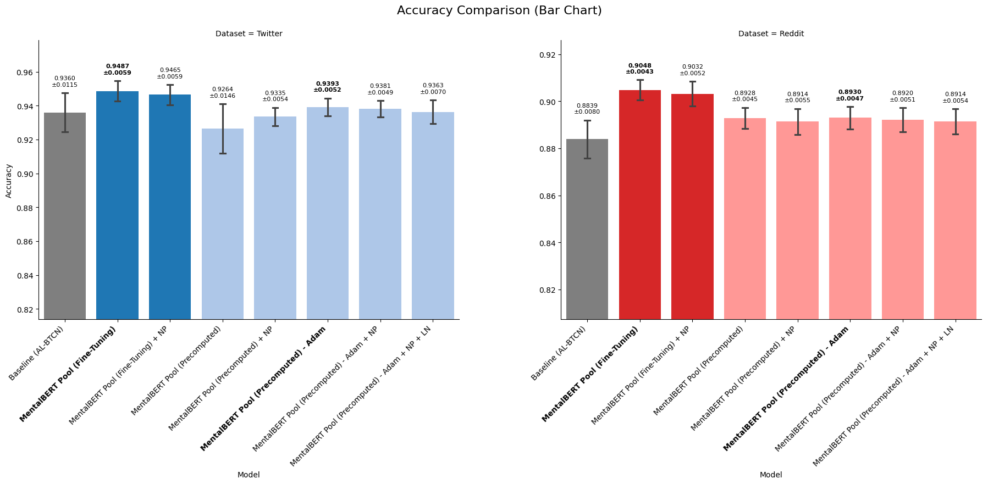

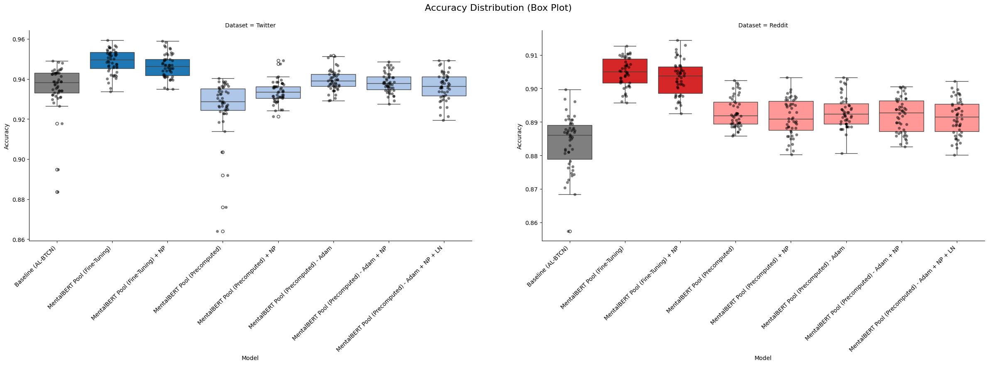

=== Precision ===


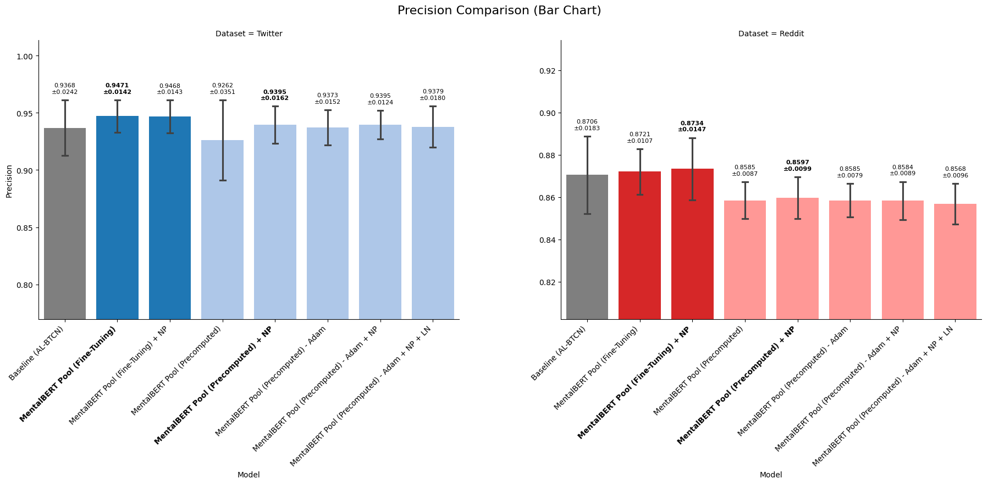

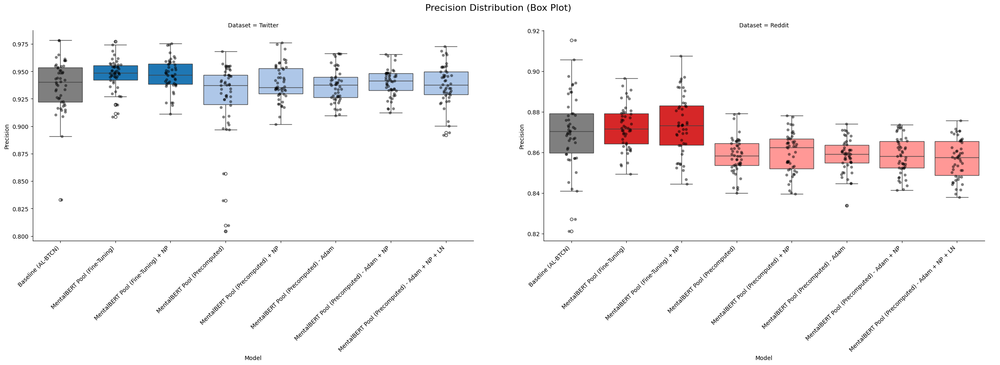

=== Recall ===


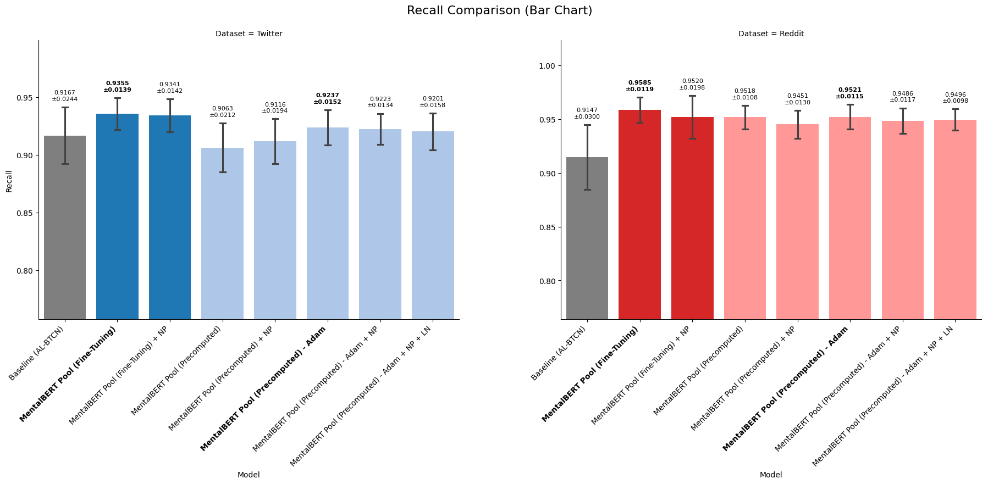

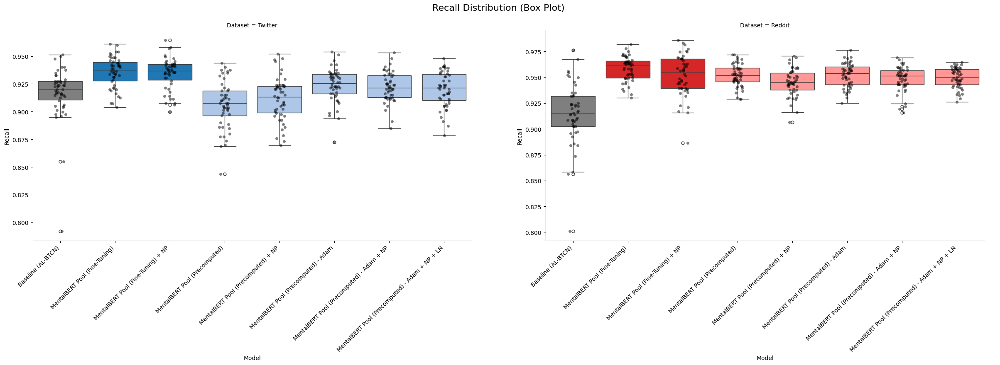

=== F1-Score ===


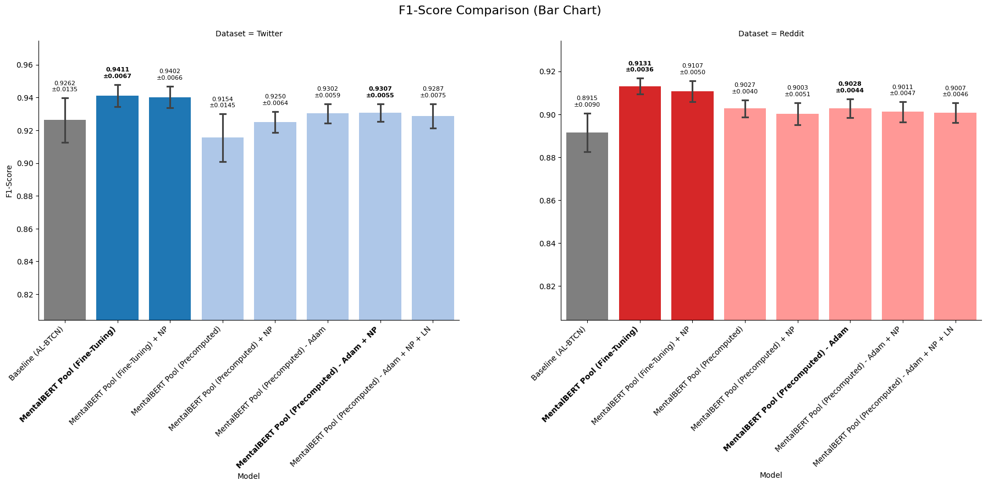

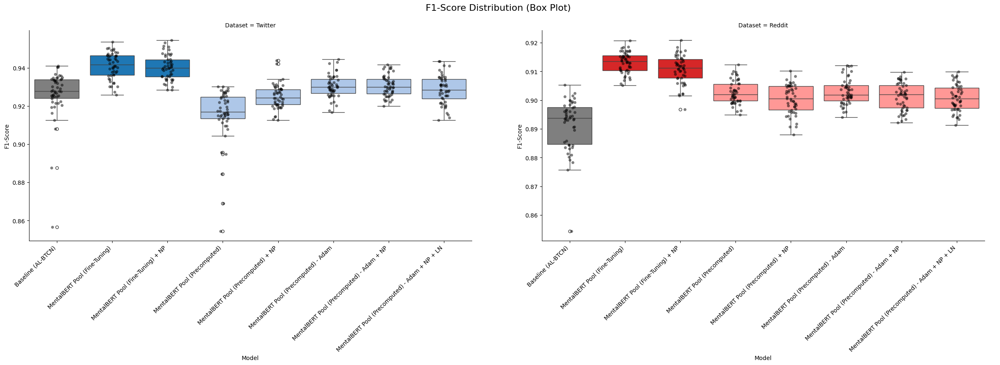

=== Training Time (s) ===


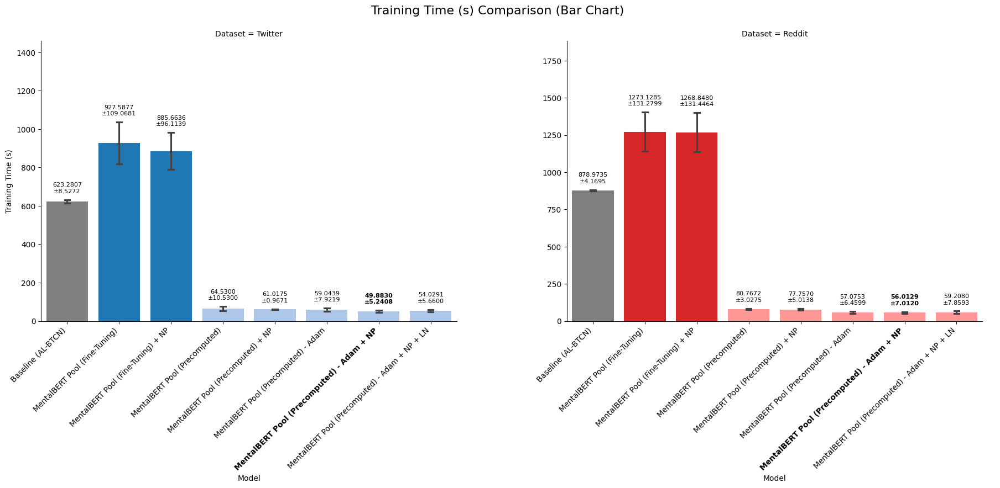

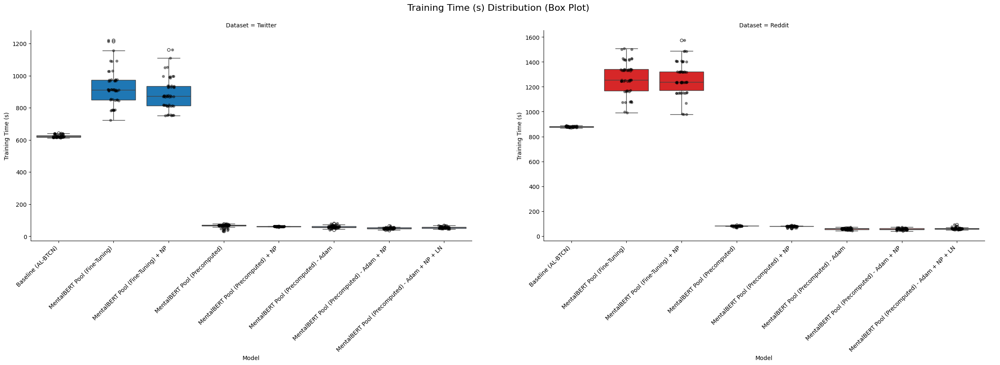

=== Max GPU Memory (MB) ===


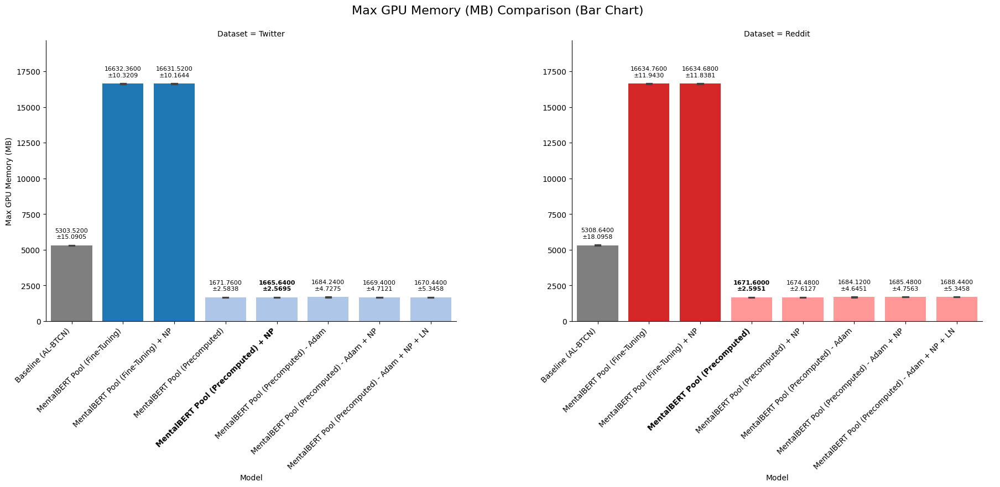

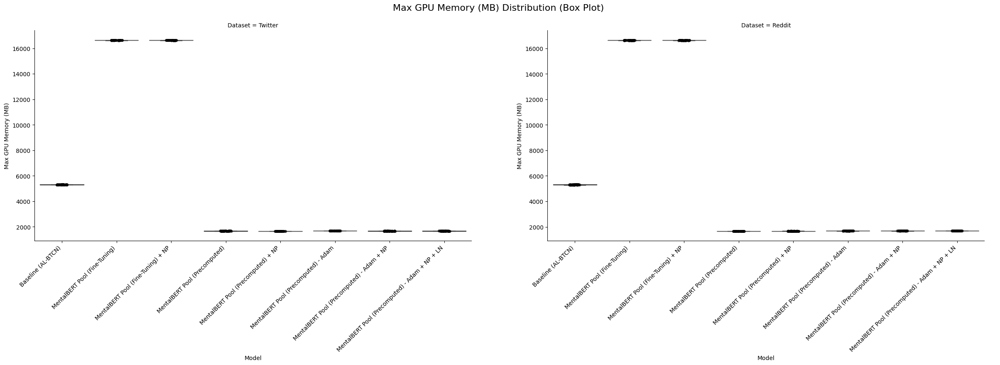

=== Avg GPU Memory (MB) ===


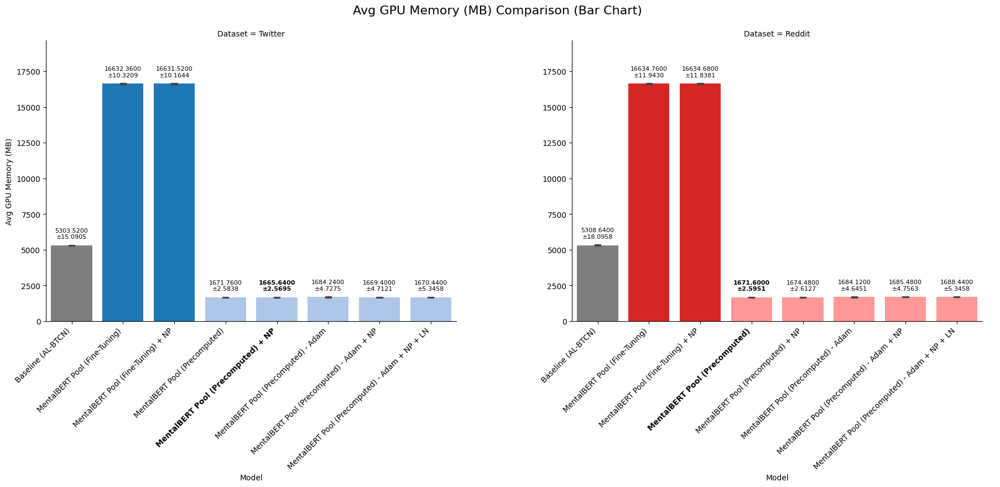

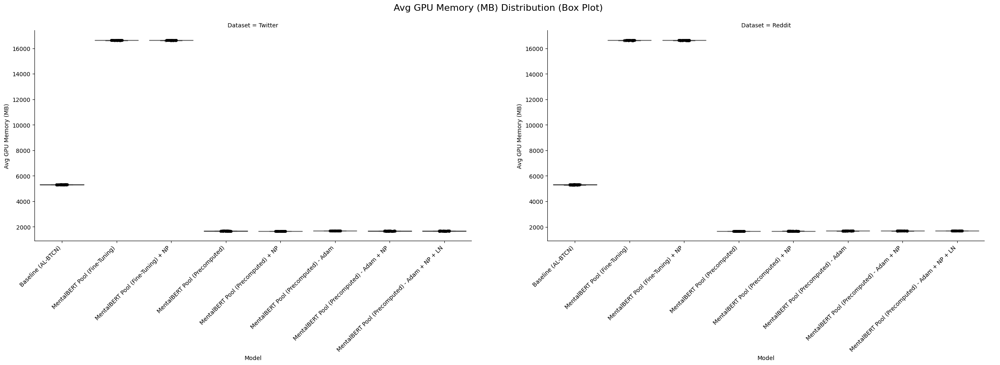

=== Epochs Run ===


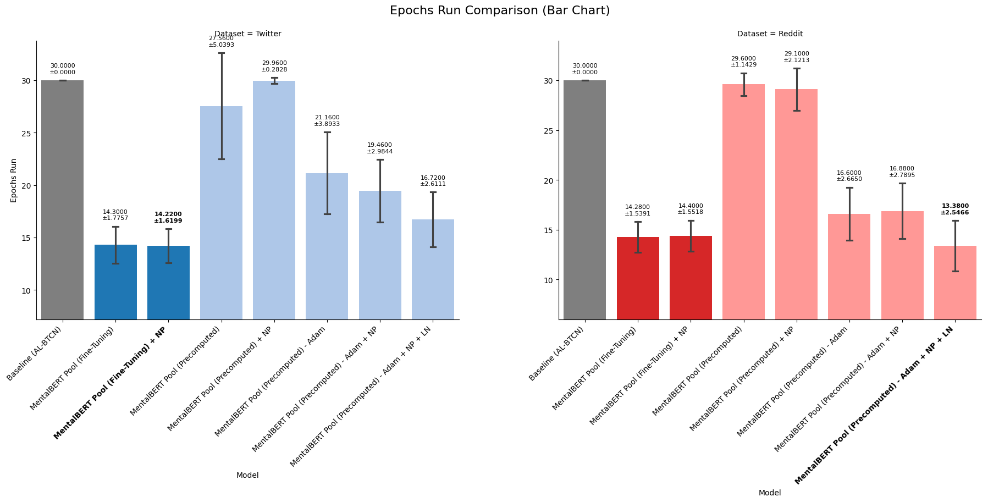

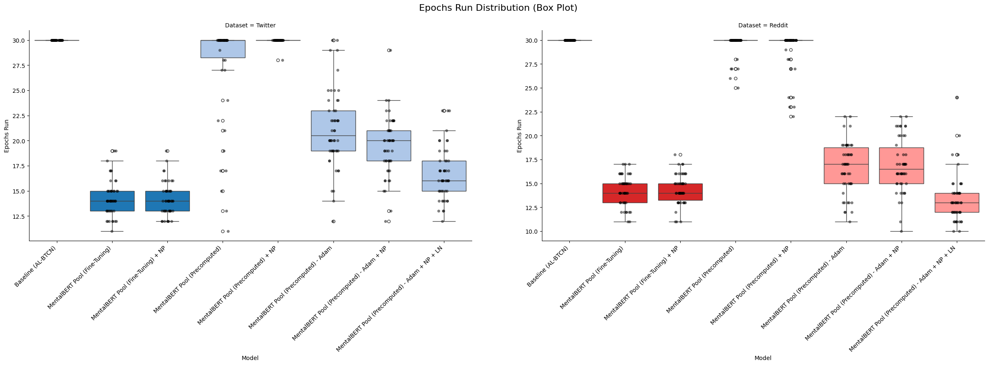

=== Avg Time/Epoch (s) ===


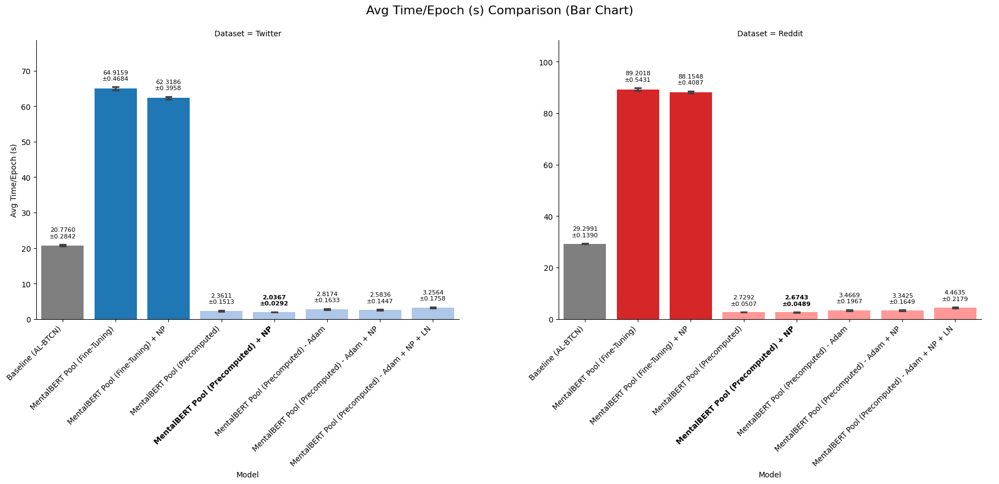

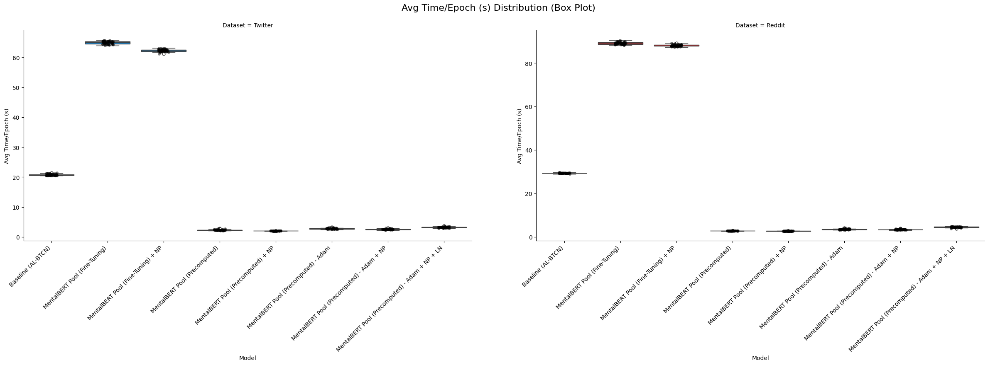

In [3]:
# Define Metrics and Order
metrics_to_plot = [
    'Accuracy', 'Precision', 'Recall', 'F1-Score', 
    'Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 
    'Epochs Run', 'Avg Time/Epoch (s)'
]

model_order = [
    'Baseline (AL-BTCN)',
    'MentalBERT Pool (Fine-Tuning)',
    'MentalBERT Pool (Fine-Tuning) + NP',
    'MentalBERT Pool (Precomputed)',
    'MentalBERT Pool (Precomputed) + NP',
    'MentalBERT Pool (Precomputed) - Adam',
    'MentalBERT Pool (Precomputed) - Adam + NP',
    'MentalBERT Pool (Precomputed) - Adam + NP + LN'
]

# Generate Plots
for metric in metrics_to_plot:
    print(f"=== {metric} ===")
    plot_combined_barchart(full_df, metric, order=model_order)
    plot_combined_boxplot(full_df, metric, order=model_order)

In [4]:
# Define Plotting Functions

def plot_barchart_dataset(df, dataset_name, metric, order=None):
    """
    Plots a bar chart for a specific dataset and metric.
    """
    # Determine if higher is better based on metric name
    higher_is_better = 'Time' not in metric and 'Memory' not in metric and 'Epochs' not in metric
    
    # Metrics to exclude from group-wise bolding
    exclude_from_group_bolding = ['Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 'Epochs Run', 'Avg Time/Epoch (s)']
    use_group_bolding = metric not in exclude_from_group_bolding
    
    # Filter for dataset
    data = df[df['Dataset'] == dataset_name]
    
    if data.empty:
        print(f"No data for {dataset_name}")
        return

    plt.figure(figsize=(11, 7))
    ax = sns.barplot(
        data=data,
        x="Model Name",
        y=metric,
        order=order,
        errorbar='sd', # Show standard deviation
        capsize=.1
    )
    
    # Adjust y-axis limits
    y_min = df[metric].min()
    y_max = df[metric].max()
    y_range = y_max - y_min
    
    lower_ylim = y_min - y_range * 0.2
    if not higher_is_better and 'Accuracy' not in metric and 'F1' not in metric: # For time/memory, start from 0 usually, unless range is small
         lower_ylim = max(0, lower_ylim)
    
    # For accuracy/f1, we might want to zoom in, but let's keep it dynamic
    if 'Accuracy' in metric or 'F1' in metric or 'Precision' in metric or 'Recall' in metric:
         lower_ylim = max(0, y_min - 0.05) # Zoom in a bit for metrics
         
    upper_ylim = y_max + y_range * 0.2
    
    plt.ylim(lower_ylim, upper_ylim)
    
    plt.title(f'{metric} - {dataset_name}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    
    # Add annotations
    
    best_models = []
    
    if use_group_bolding:
        # Find best in 'Precomputed' and 'Fine-Tuning' groups
        if 'Model Group' in data.columns:
            for group in ['Precomputed', 'Fine-Tuning']:
                group_df = data[data['Model Group'] == group]
                if group_df.empty: continue
                
                means = group_df.groupby('Model Name')[metric].mean()
                if means.empty: continue
                
                if higher_is_better:
                    best_model = means.idxmax()
                else:
                    best_model = means.idxmin()
                best_models.append(best_model)
        else:
             # Fallback
             means = data.groupby('Model Name')[metric].mean()
             if not means.empty:
                if higher_is_better:
                    best_models.append(means.idxmax())
                else:
                    best_models.append(means.idxmin())
    else:
        # Original logic: global best
        means = data.groupby('Model Name')[metric].mean()
        if not means.empty:
            if higher_is_better:
                best_models.append(means.idxmax())
            else:
                best_models.append(means.idxmin())

    # Add text to bars
    if order:
        x_models = order
    else:
        x_models = sorted(data['Model Name'].unique())
        
    for i, patch in enumerate(ax.patches):
        if i >= len(x_models):
            continue
            
        model_name = x_models[i]
        
        subset = data[data['Model Name'] == model_name]
        
        if not subset.empty:
            mean_val = subset[metric].mean()
            std_val = subset[metric].std()
            
            x = patch.get_x() + patch.get_width() / 2
            y = patch.get_height()
            
            text = f"{mean_val:.4f}\n±{std_val:.4f}"
            
            is_best = (model_name in best_models)
            font_weight = 'bold' if is_best else 'normal'
            
            # Position text above the error bar
            text_y = y + std_val + (upper_ylim - lower_ylim)*0.02
            
            ax.text(
                x, 
                text_y, 
                text, 
                ha='center', 
                va='bottom', 
                fontsize=9, 
                color='black',
                fontweight=font_weight
            )
            
            if is_best:
                # Bold x-axis label
                xticklabels = ax.get_xticklabels()
                for label in xticklabels:
                    if label.get_text() == model_name:
                        label.set_fontweight('bold')
            
            # Apply Color
            model_group = subset['Model Group'].iloc[0] if 'Model Group' in subset.columns else 'Unknown'
            
            color = '#7f7f7f' # Default grey (Baseline)
            if dataset_name == 'Twitter':
                if model_group == 'Fine-Tuning': color = '#1f77b4' # Blue
                elif model_group == 'Precomputed': color = '#aec7e8' # Light Blue
            elif dataset_name == 'Reddit':
                if model_group == 'Fine-Tuning': color = '#d62728' # Red
                elif model_group == 'Precomputed': color = '#ff9896' # Light Red
            
            patch.set_facecolor(color)

    plt.tight_layout()
    plt.show()

def plot_boxplot_comparison(df, dataset_name, metric, order=None):
    """
    Plots a boxplot comparison for a specific dataset.
    """
    data = df[df['Dataset'] == dataset_name]
    
    if data.empty:
        return

    plt.figure(figsize=(14, 7))
    ax = sns.boxplot(
        data=data,
        x="Model Name",
        y=metric,
        order=order
    )
    
    # Add points
    sns.stripplot(
        data=data,
        x="Model Name",
        y=metric,
        order=order,
        color='black',
        alpha=0.5,
        jitter=True,
        ax=ax
    )
    
    plt.title(f'{metric} Distribution - {dataset_name}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    
    # Apply colors
    x_models = [label.get_text() for label in ax.get_xticklabels()]
    boxes = ax.artists if ax.artists else ax.patches
    
    for i, box in enumerate(boxes):
        if i >= len(x_models):
            continue
            
        model_name = x_models[i]
        subset = data[data['Model Name'] == model_name]
        
        if not subset.empty:
            # Determine Color
            model_group = subset['Model Group'].iloc[0] if 'Model Group' in subset.columns else 'Unknown'
            
            color = '#7f7f7f' # Default grey (Baseline)
            if dataset_name == 'Twitter':
                if model_group == 'Fine-Tuning': color = '#1f77b4' # Blue
                elif model_group == 'Precomputed': color = '#aec7e8' # Light Blue
            elif dataset_name == 'Reddit':
                if model_group == 'Fine-Tuning': color = '#d62728' # Red
                elif model_group == 'Precomputed': color = '#ff9896' # Light Red
            
            box.set_facecolor(color)

    plt.tight_layout()
    plt.show()

In [5]:
# Define Metrics and Order
metrics_to_plot = [
    'Accuracy', 'Precision', 'Recall', 'F1-Score', 
    'Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 
    'Epochs Run', 'Avg Time/Epoch (s)'
]

# Define a logical order for models
model_order_v2 = [
    'Baseline (AL-BTCN)',
    'MentalBERT Pool (Fine-Tuning)',
    'MentalBERT Pool (Fine-Tuning) + NP',
    'MentalBERT Pool (Precomputed)',
    'MentalBERT Pool (Precomputed) + NP',
    'MentalBERT Pool (Precomputed) - Adam',
    'MentalBERT Pool (Precomputed) - Adam + NP',
    'MentalBERT Pool (Precomputed) - Adam + NP + LN'
]

# Use full_df directly as we updated the loading logic
full_df_v2 = full_df

print("Updated Model Names:", full_df_v2['Model Name'].unique())

Updated Model Names: ['Baseline (AL-BTCN)' 'MentalBERT Pool (Fine-Tuning)'
 'MentalBERT Pool (Precomputed)' 'MentalBERT Pool (Precomputed) - Adam'
 'MentalBERT Pool (Fine-Tuning) + NP'
 'MentalBERT Pool (Precomputed) - Adam + NP'
 'MentalBERT Pool (Precomputed) - Adam + NP + LN'
 'MentalBERT Pool (Precomputed) + NP']


=== Accuracy ===
--- Reddit ---


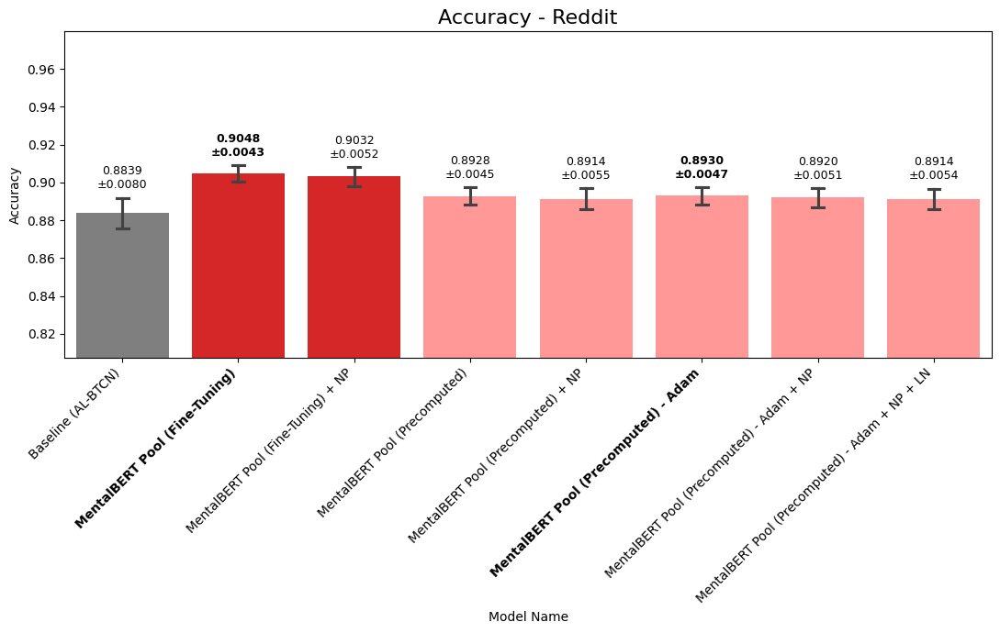

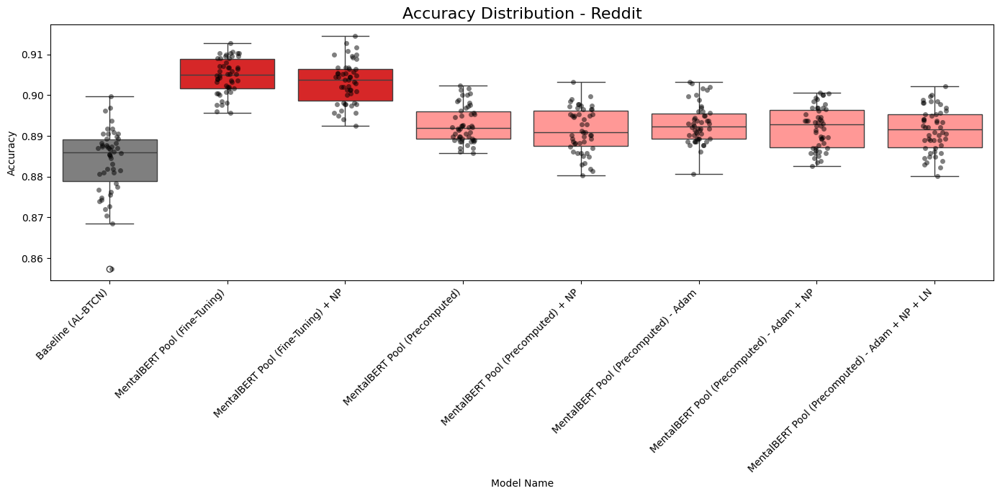

--- Twitter ---


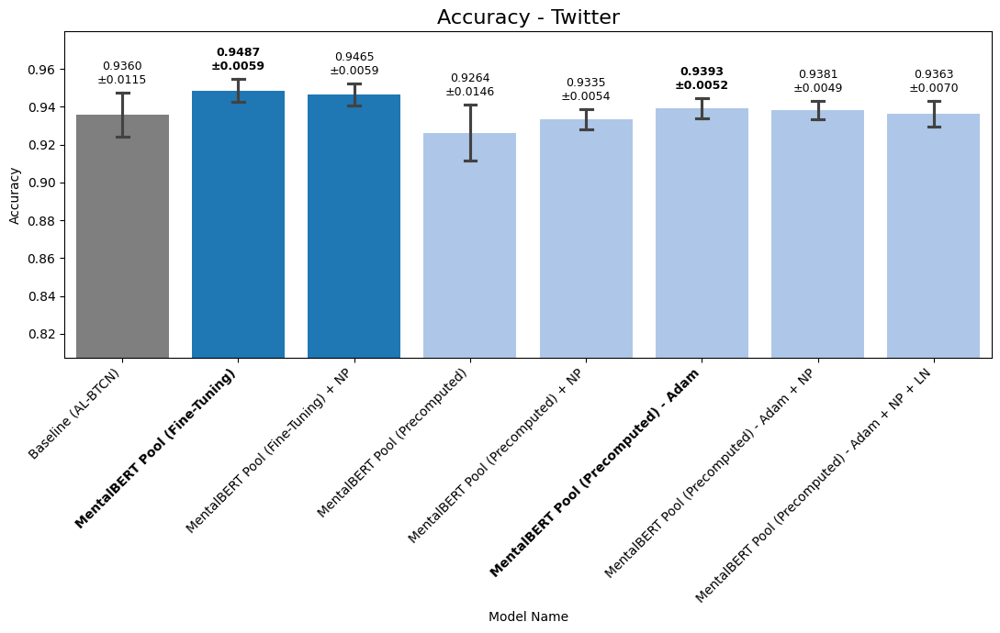

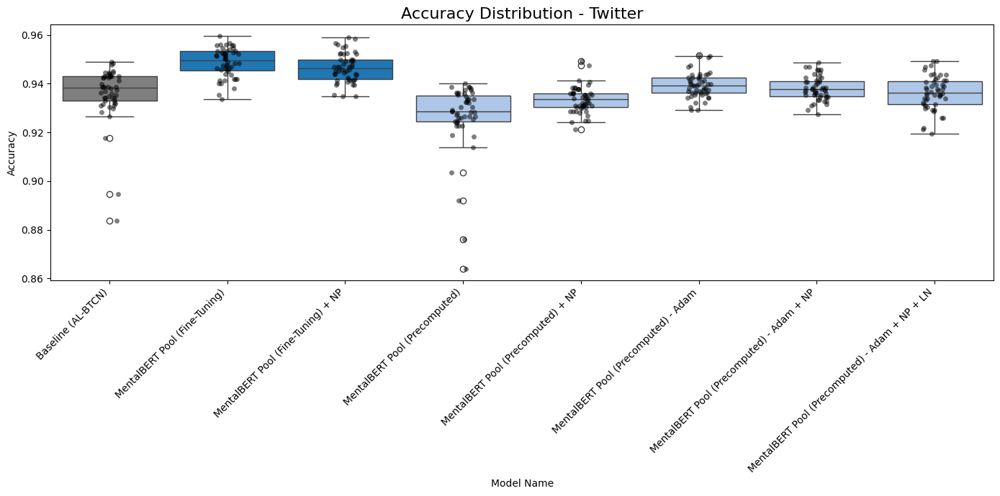

=== Precision ===
--- Reddit ---


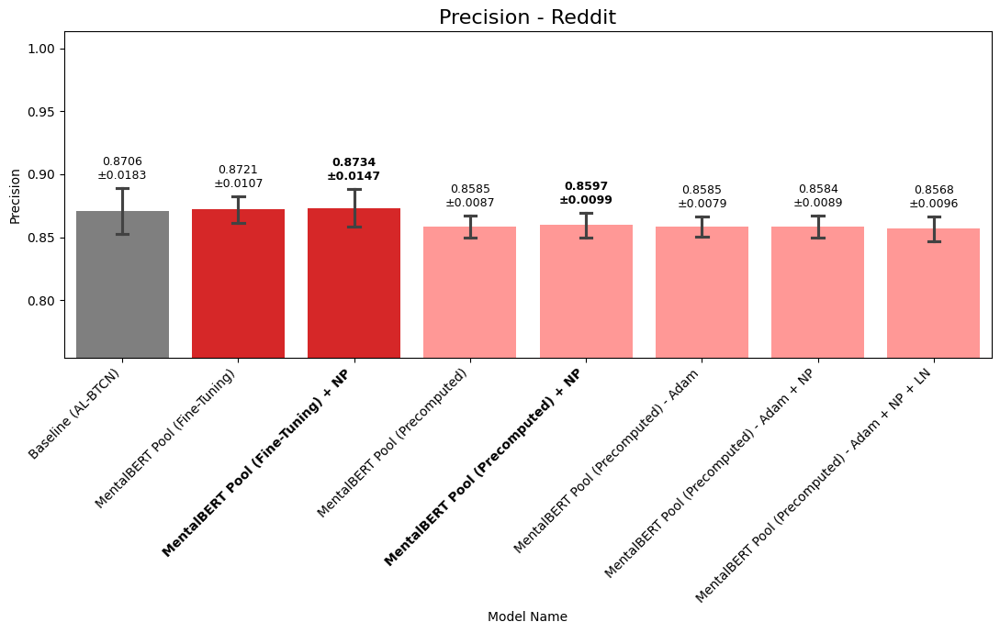

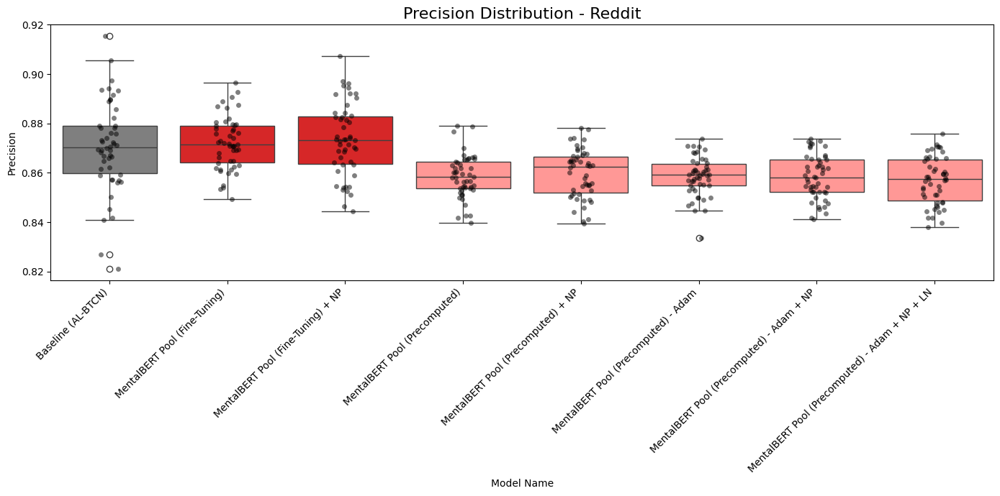

--- Twitter ---


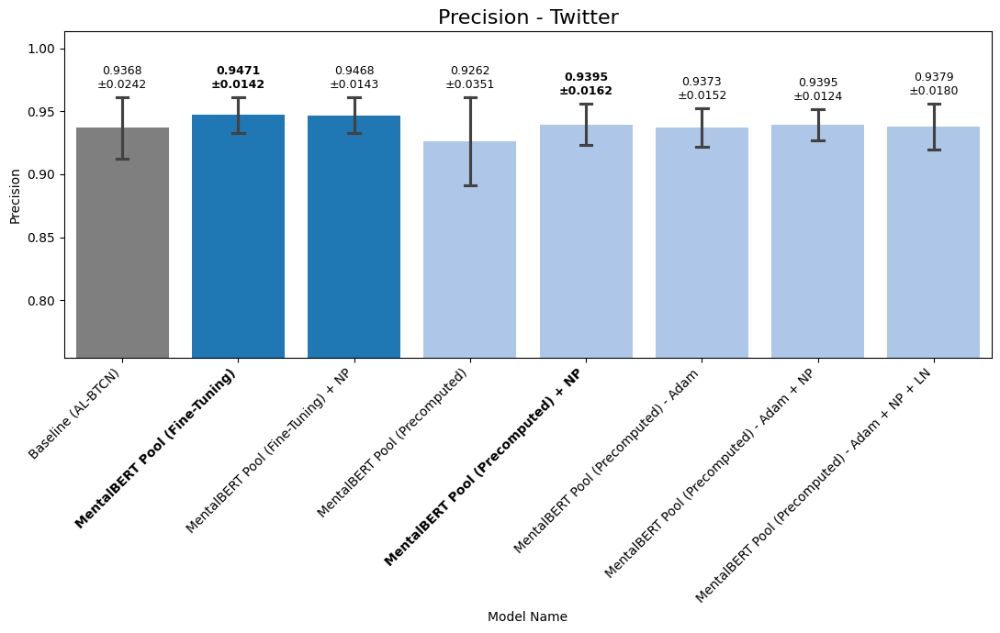

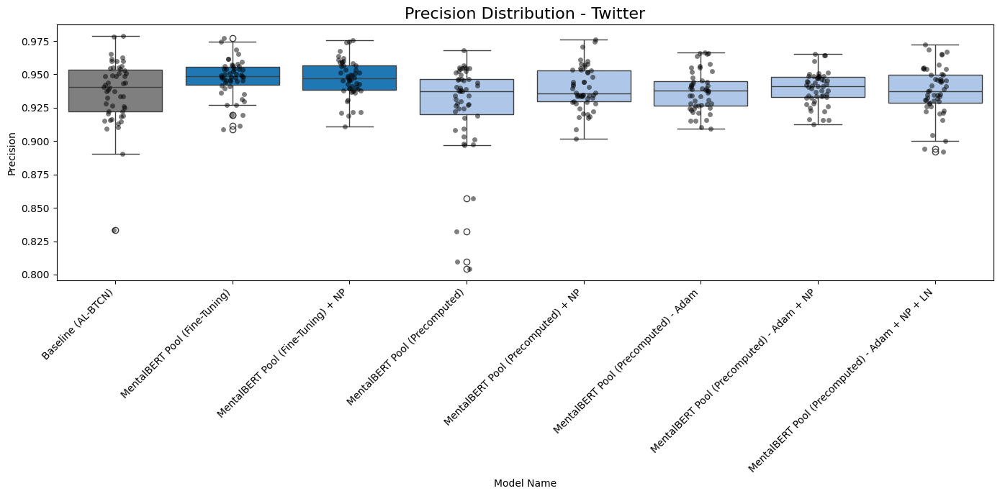

=== Recall ===
--- Reddit ---


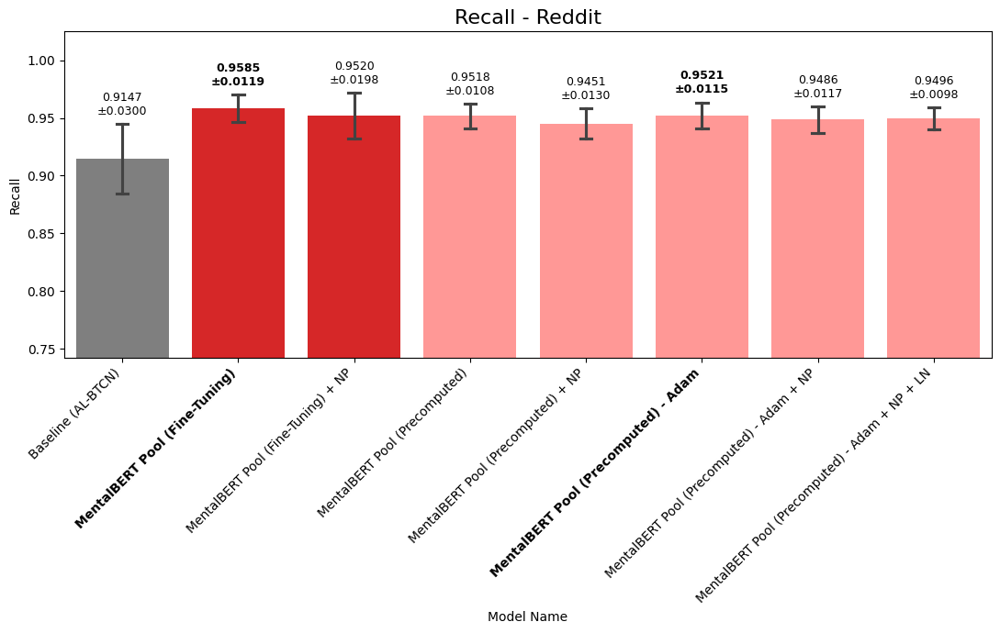

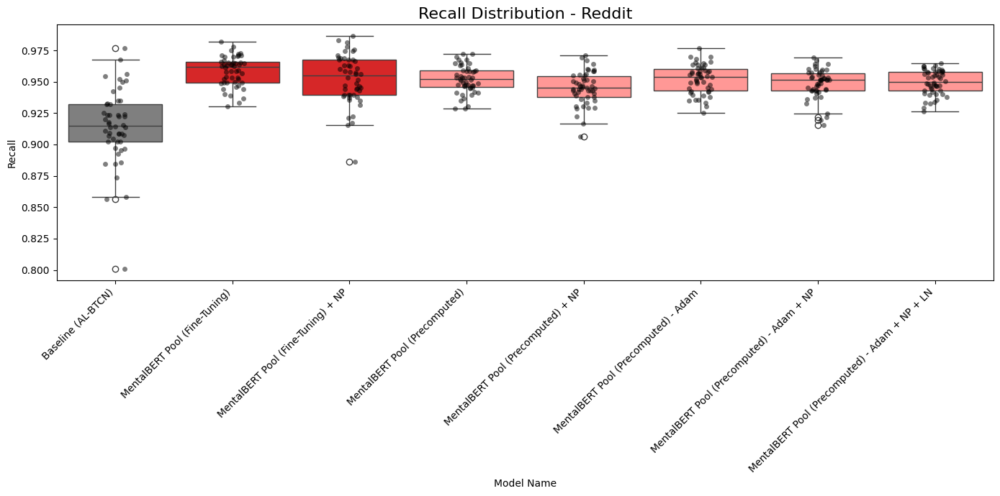

--- Twitter ---


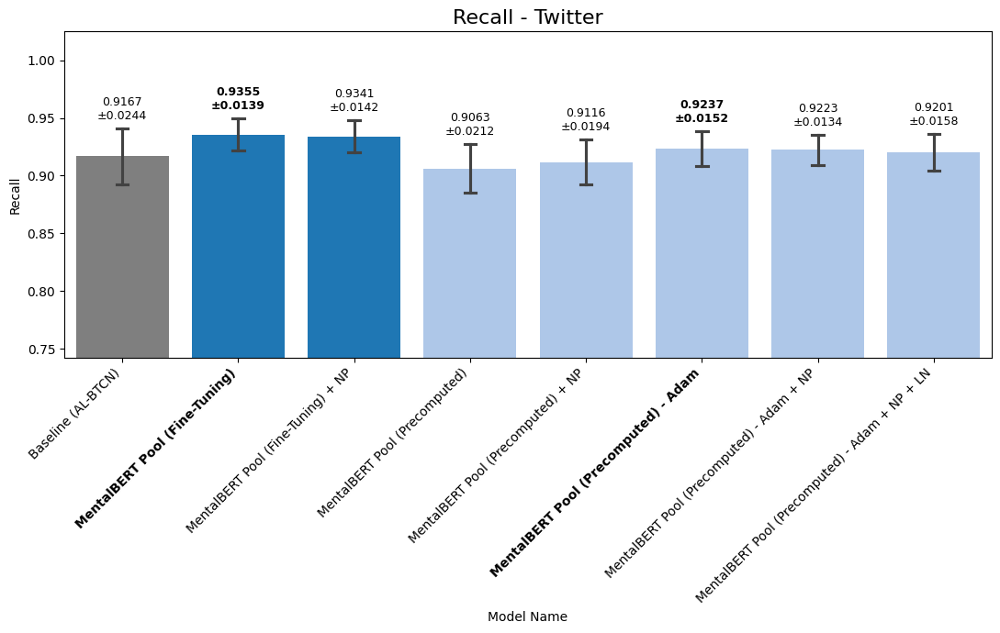

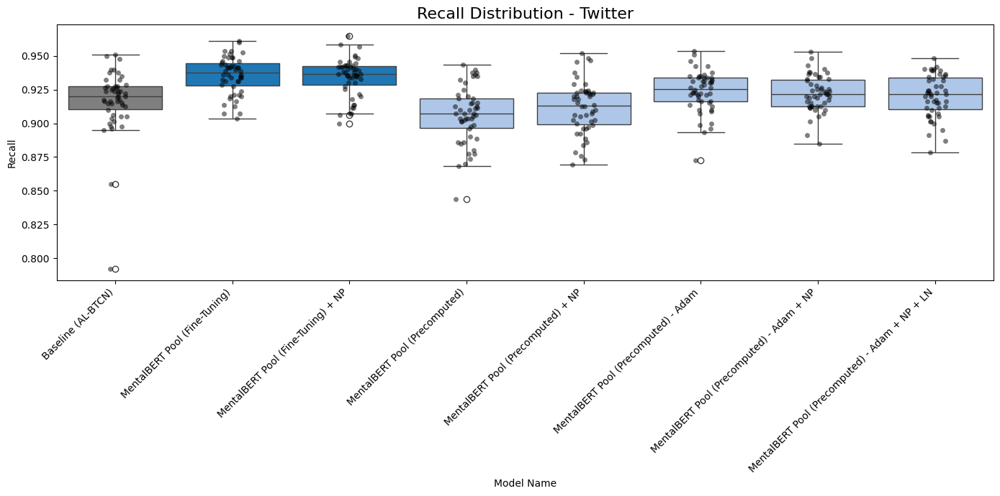

=== F1-Score ===
--- Reddit ---


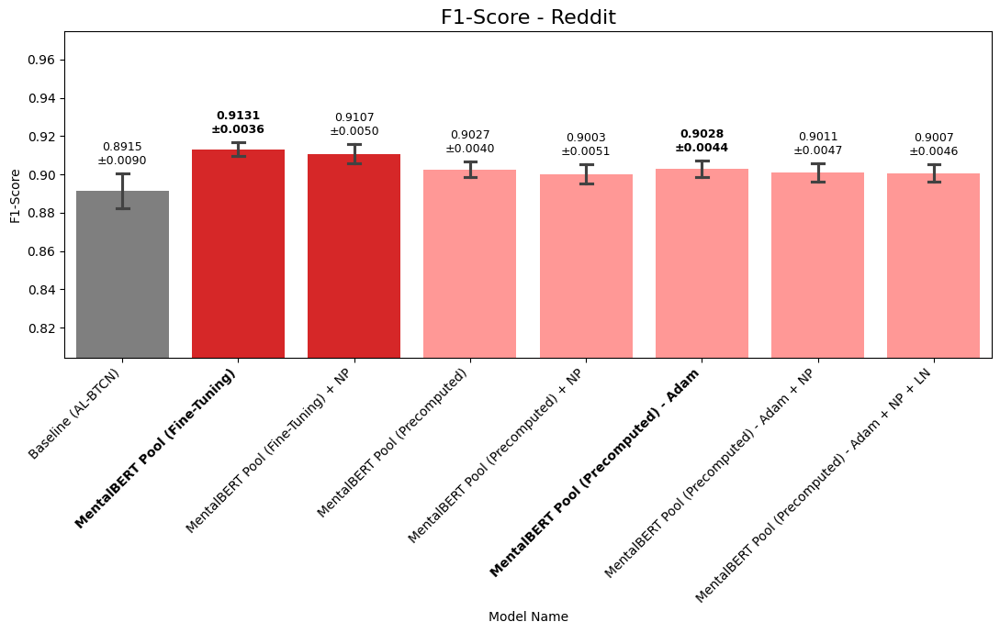

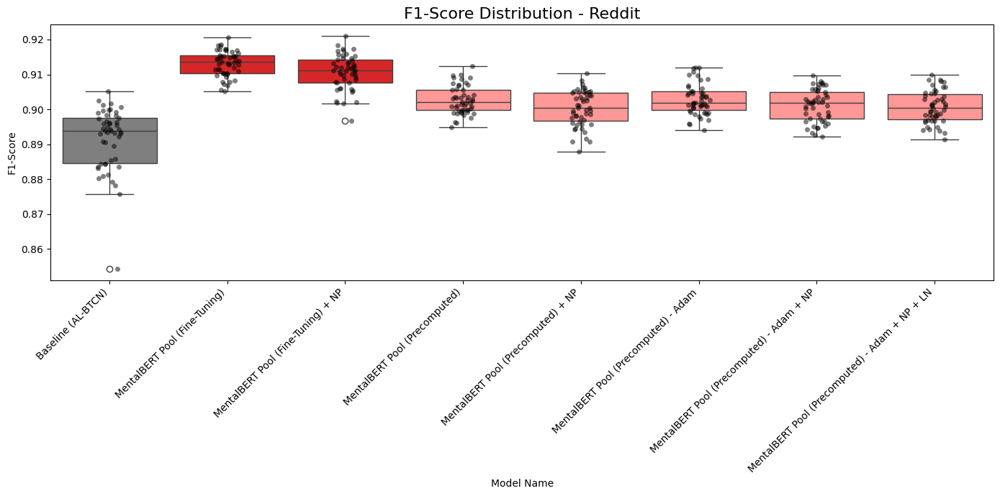

--- Twitter ---


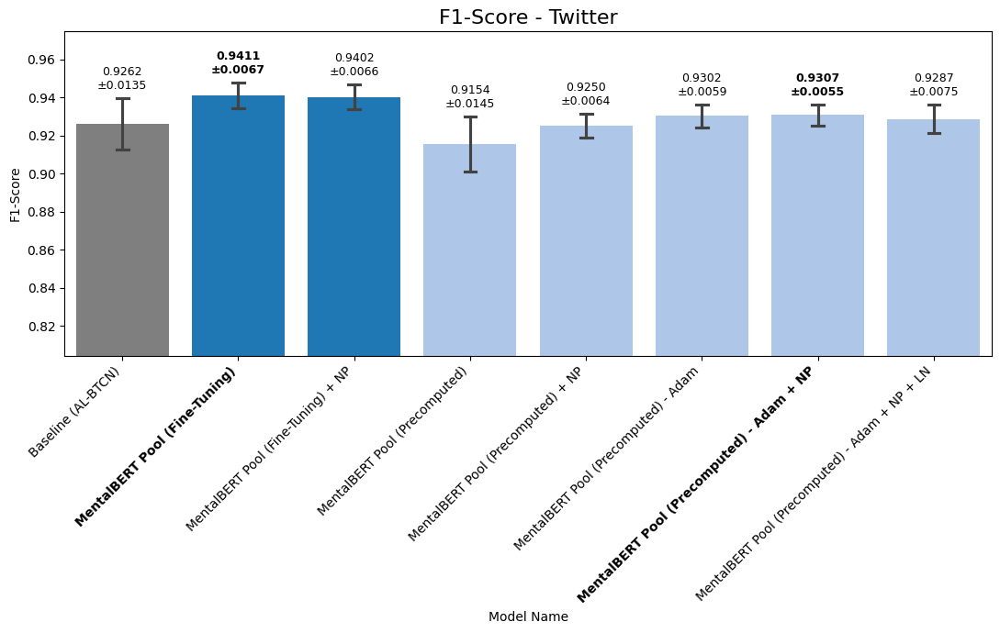

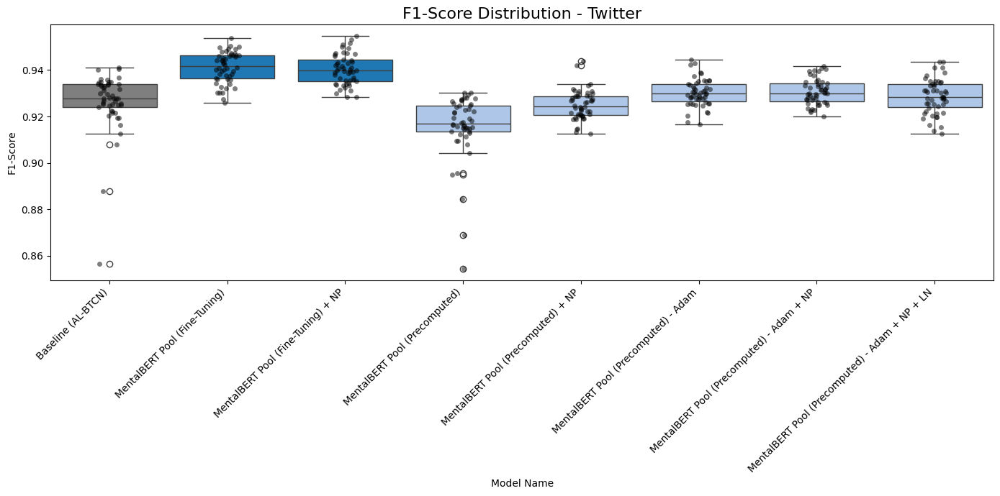

=== Training Time (s) ===
--- Reddit ---


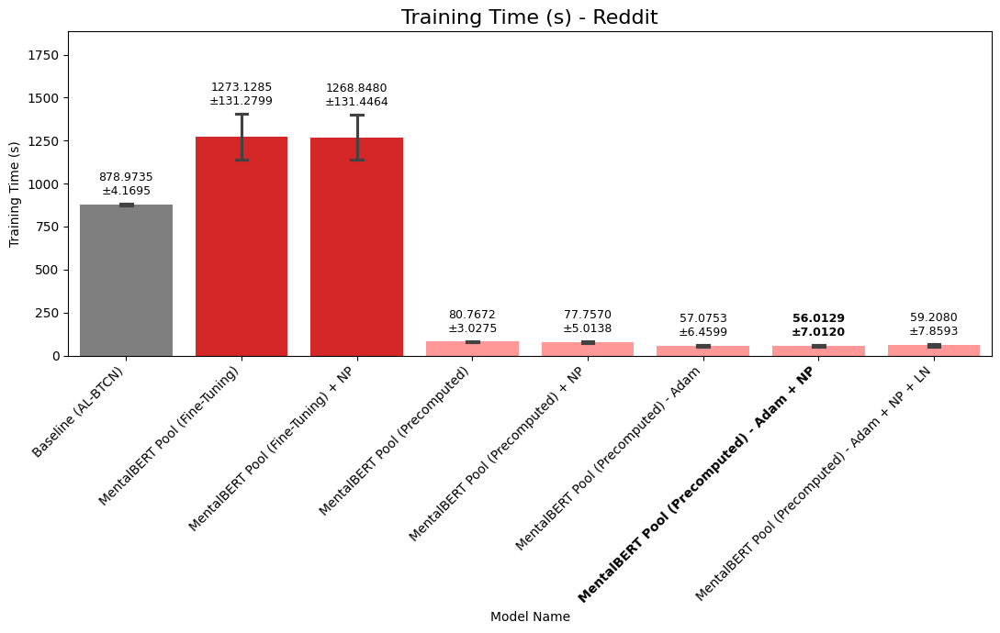

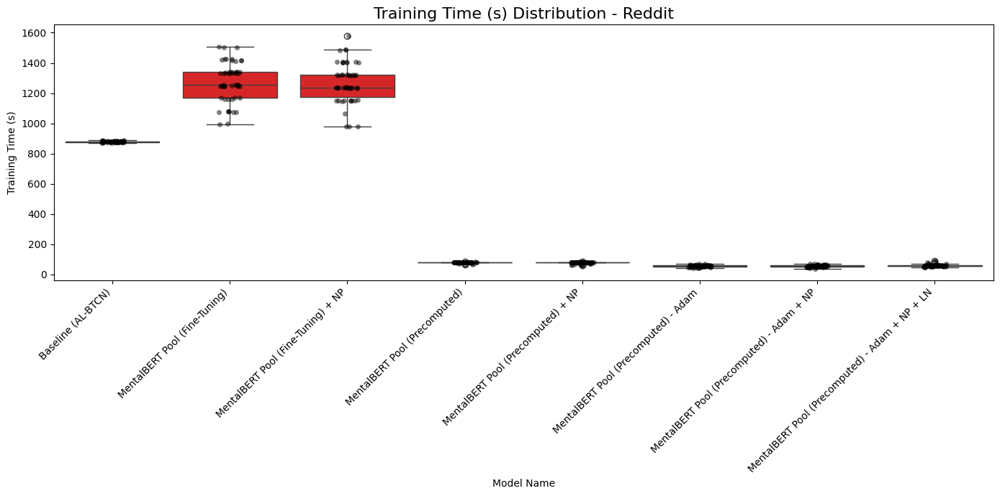

--- Twitter ---


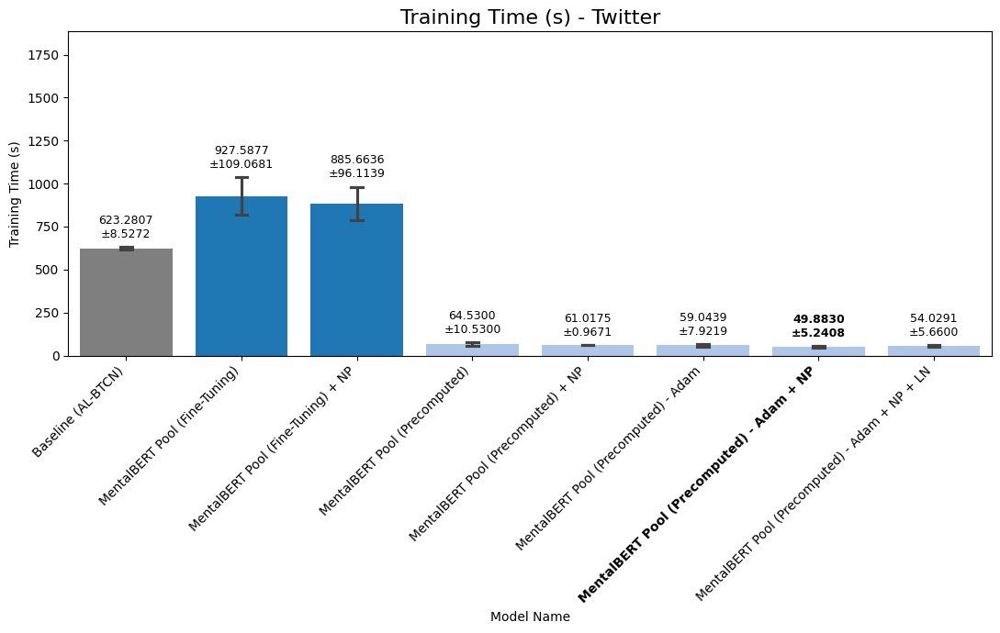

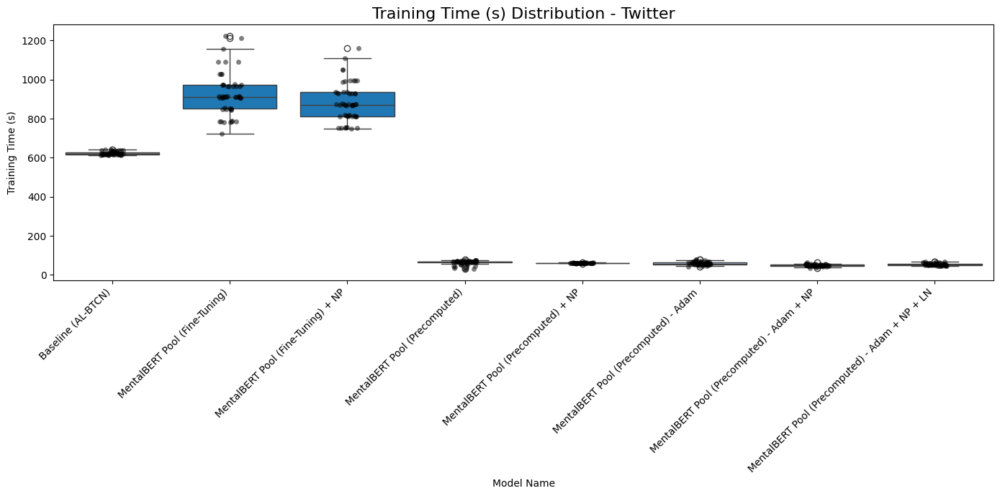

=== Max GPU Memory (MB) ===
--- Reddit ---


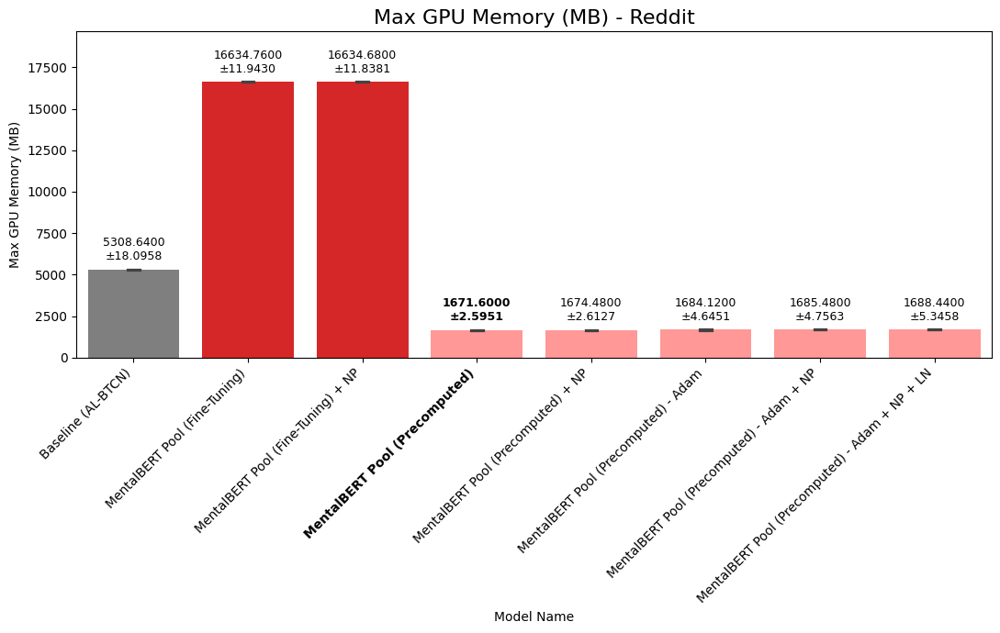

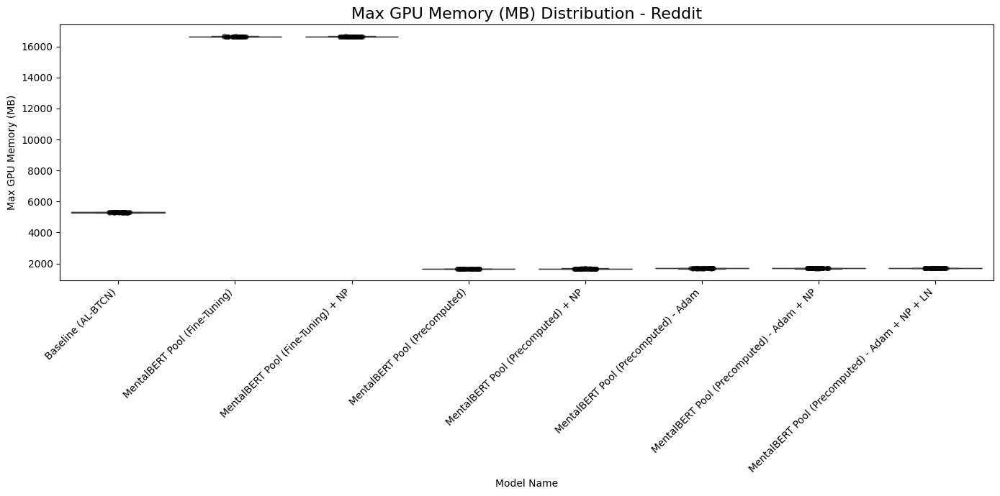

--- Twitter ---


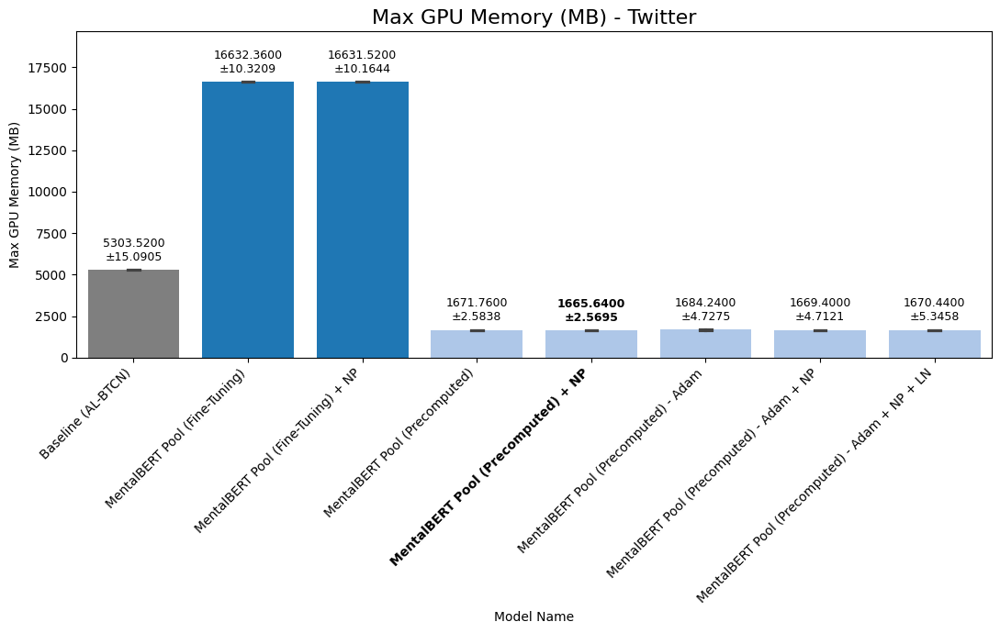

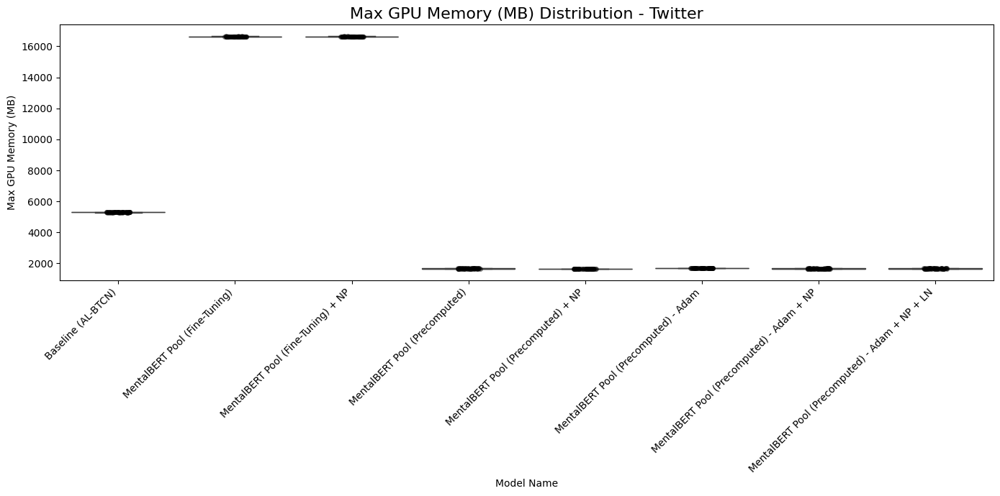

=== Avg GPU Memory (MB) ===
--- Reddit ---


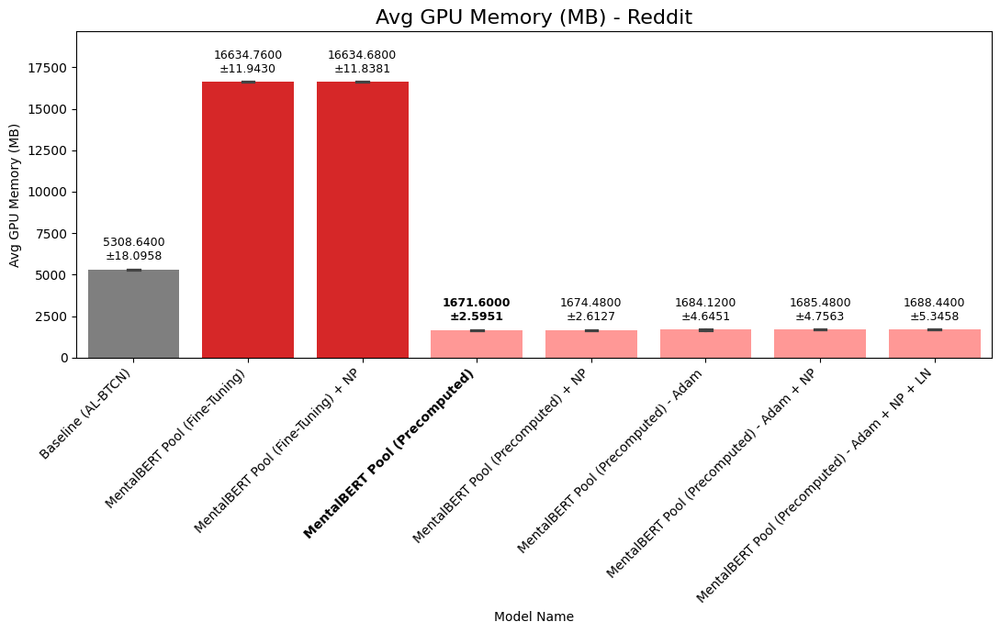

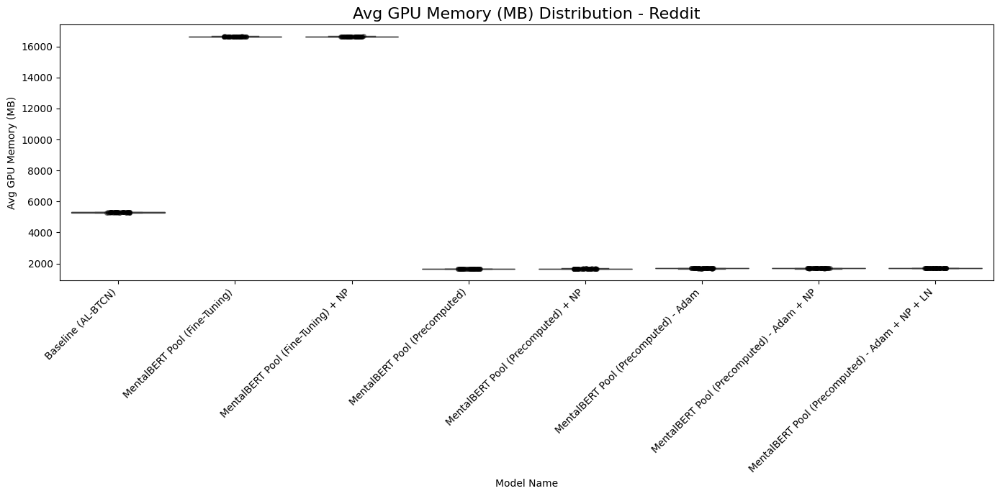

--- Twitter ---


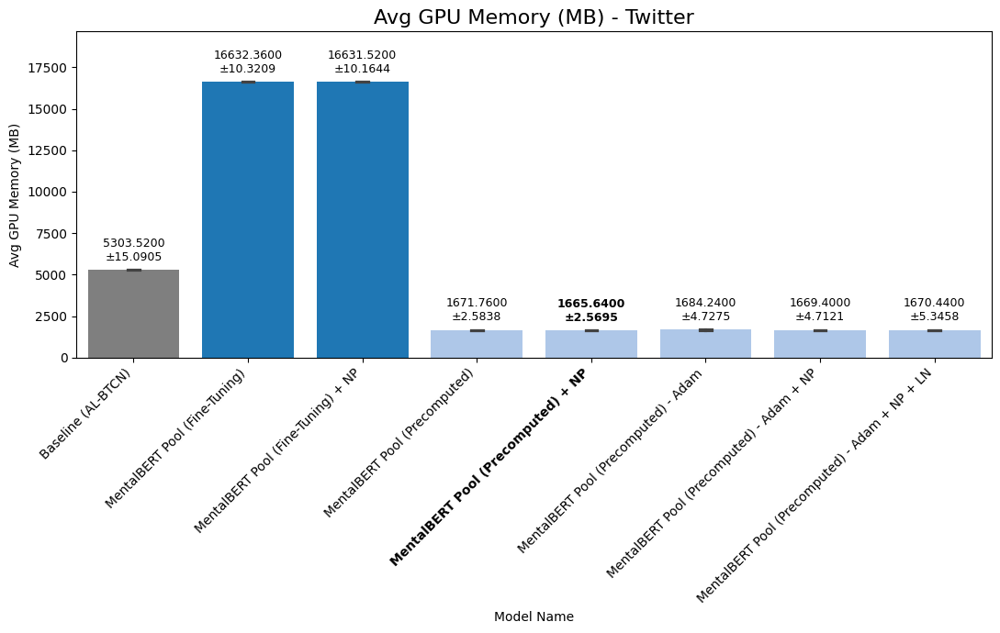

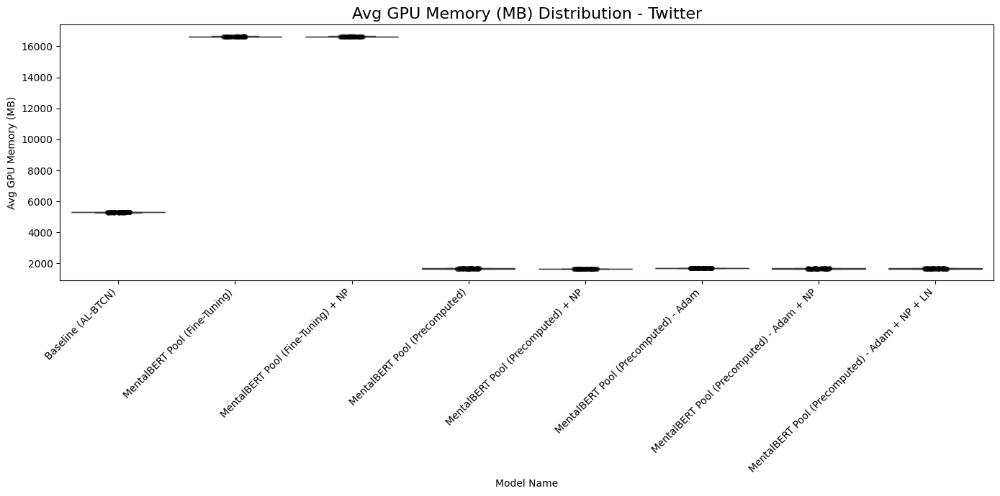

=== Epochs Run ===
--- Reddit ---


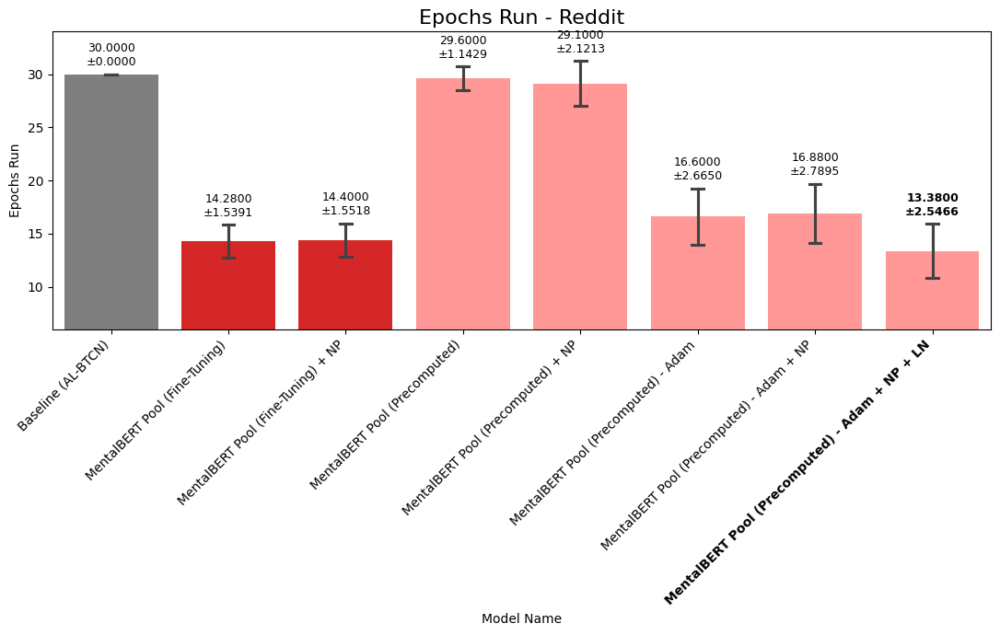

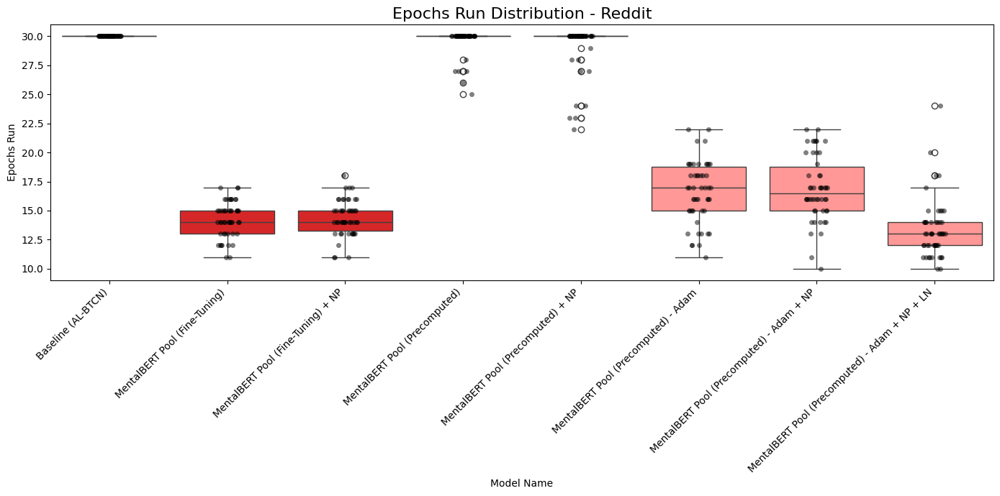

--- Twitter ---


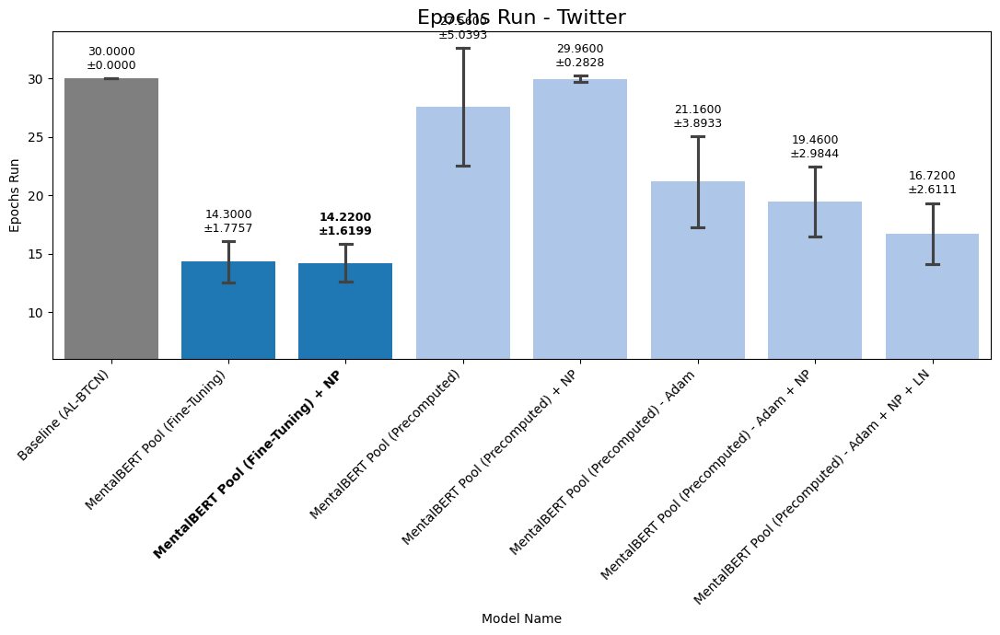

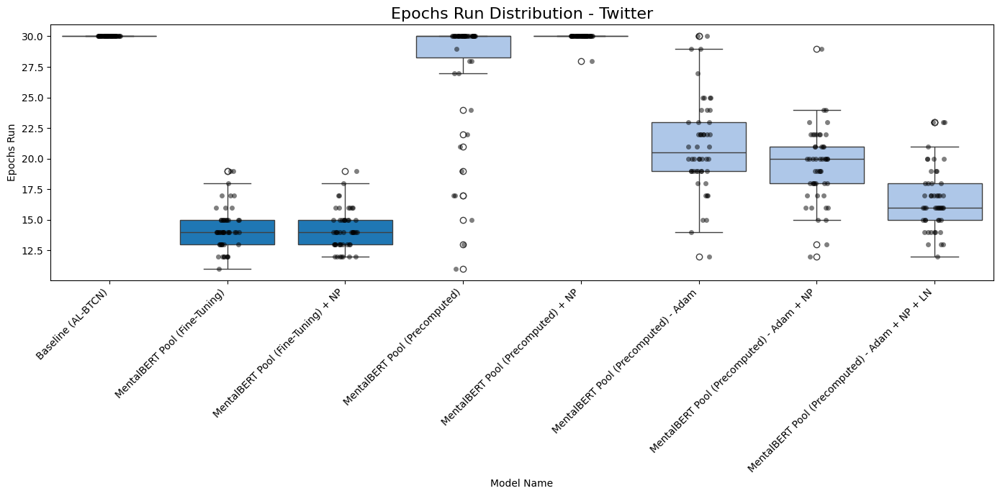

=== Avg Time/Epoch (s) ===
--- Reddit ---


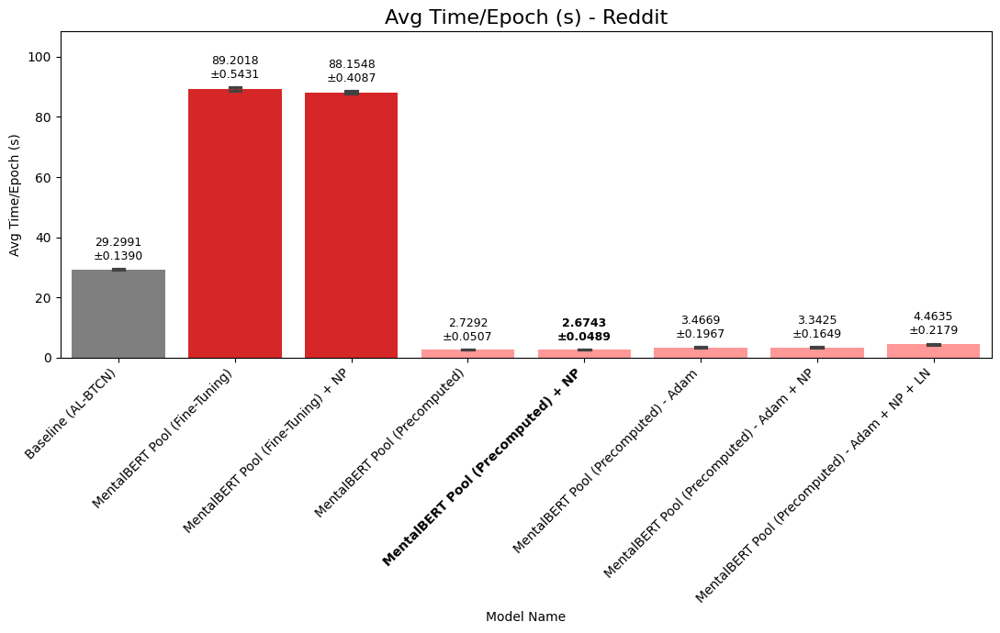

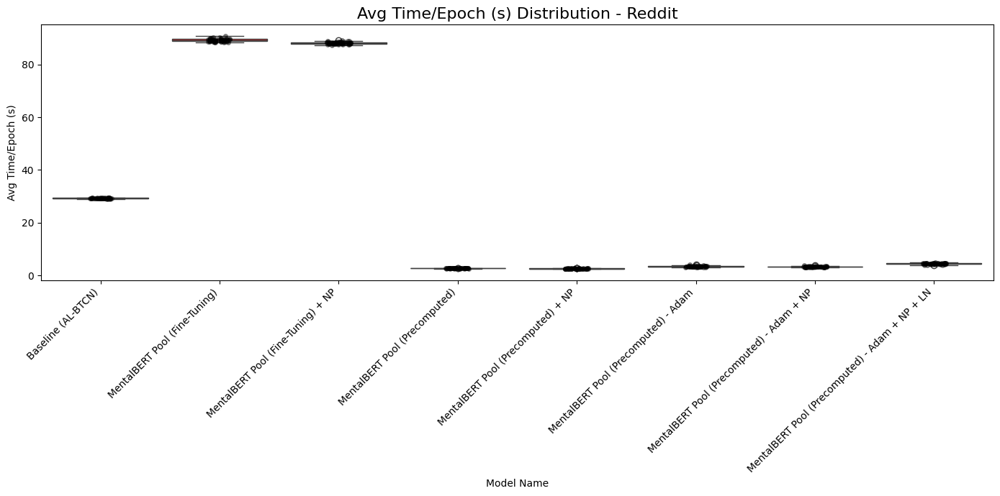

--- Twitter ---


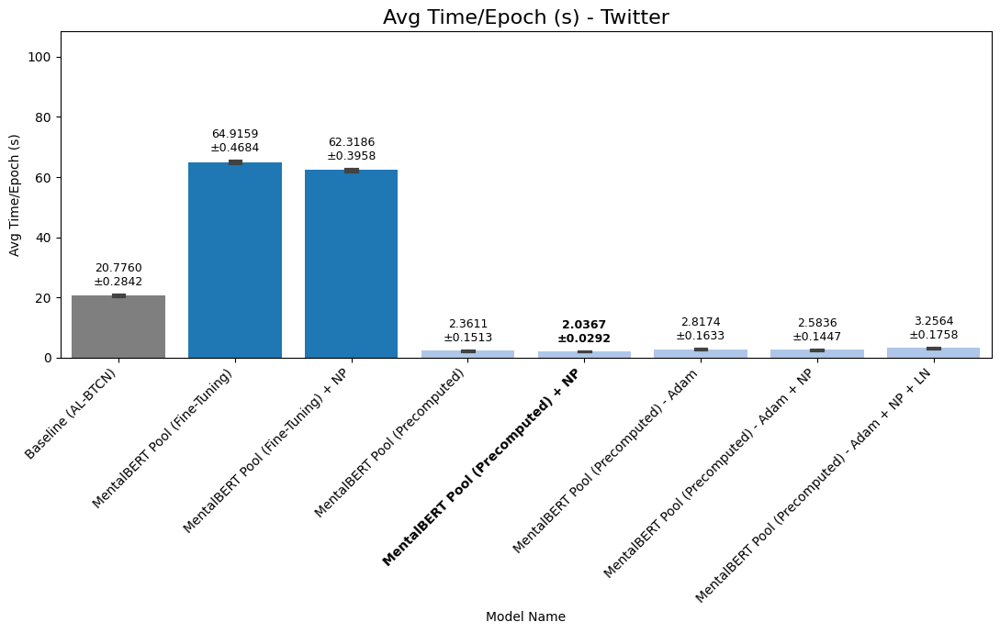

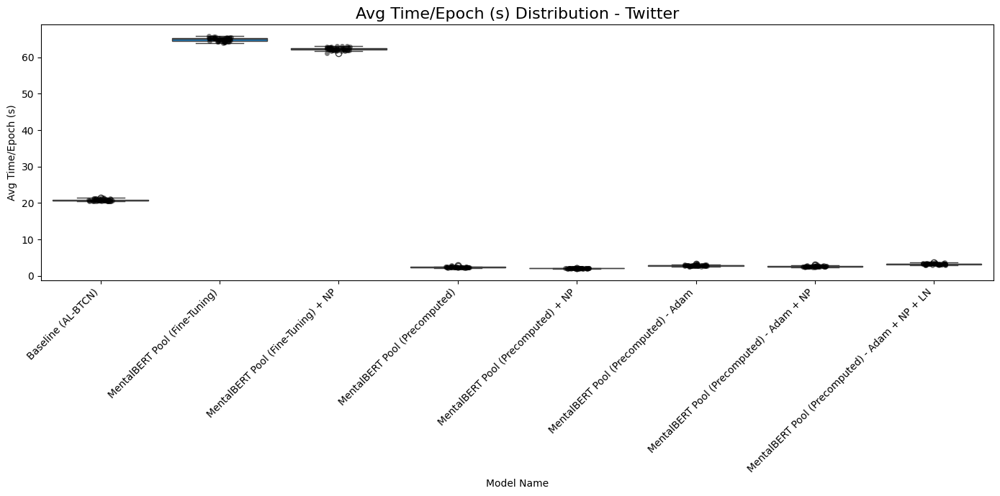

In [6]:
# Generate Plots
for metric in metrics_to_plot:
    print(f"=== {metric} ===")
    for dataset in datasets:
        print(f"--- {dataset} ---")
        # Bar Chart
        plot_barchart_dataset(full_df_v2, dataset, metric, order=model_order_v2)
        # Box Plot
        plot_boxplot_comparison(full_df_v2, dataset, metric, order=model_order_v2)

=== Trade-off Analysis for Reddit ===


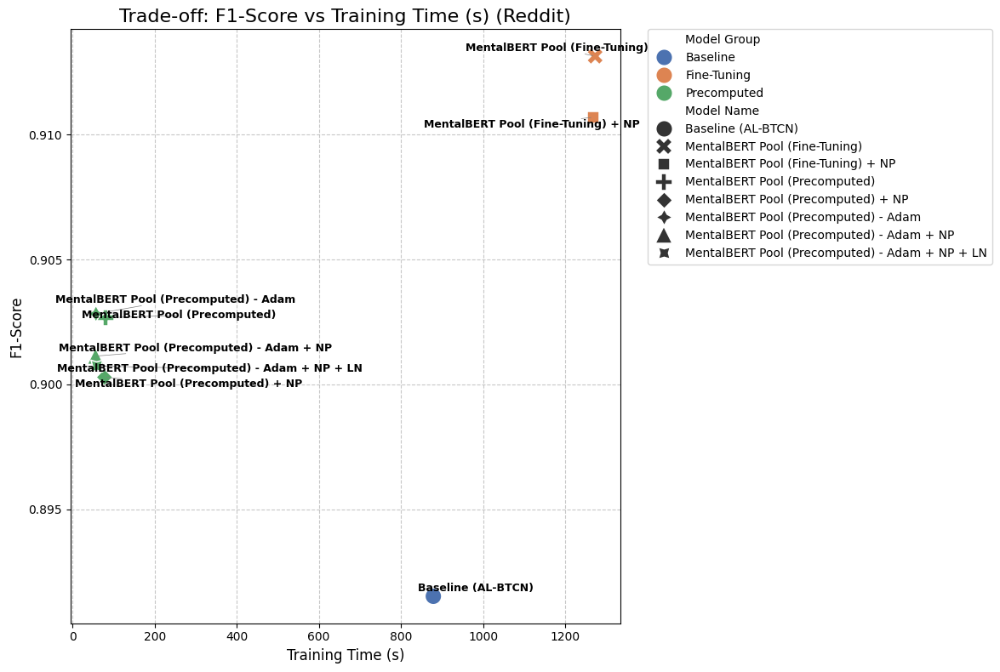

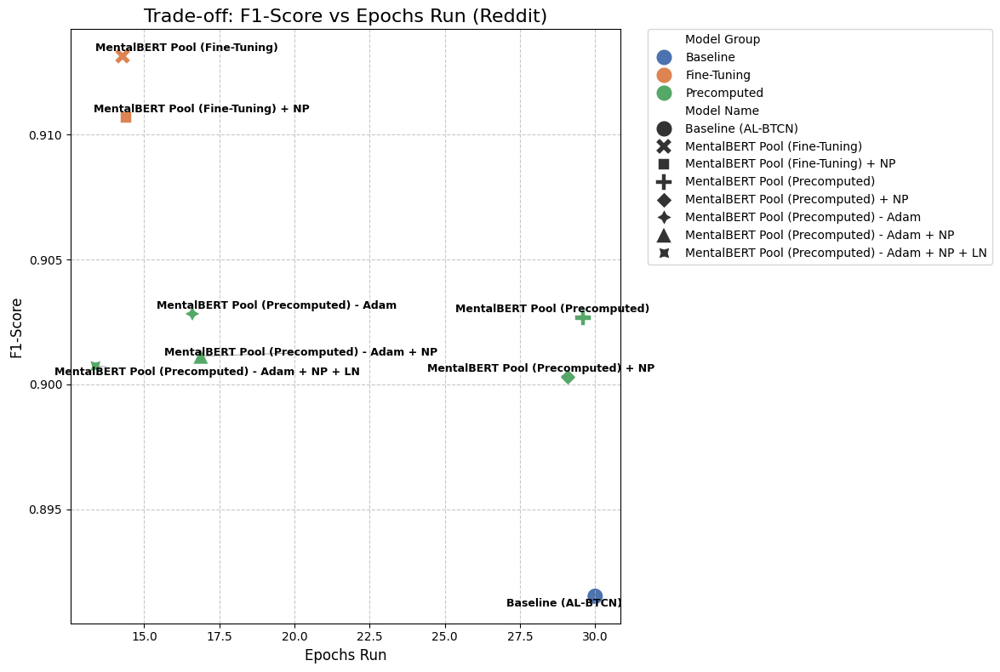

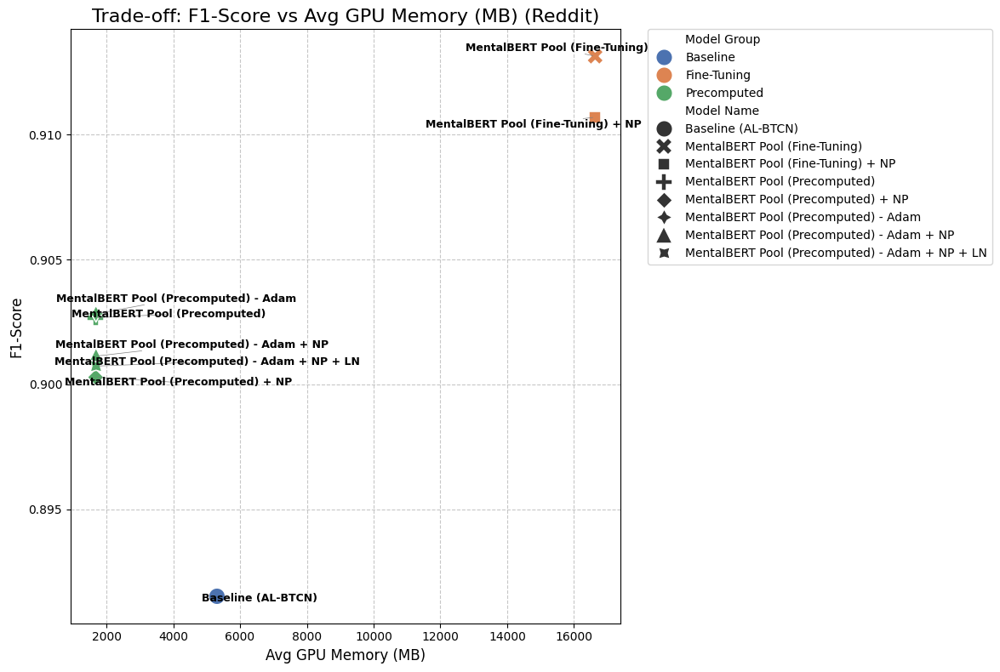

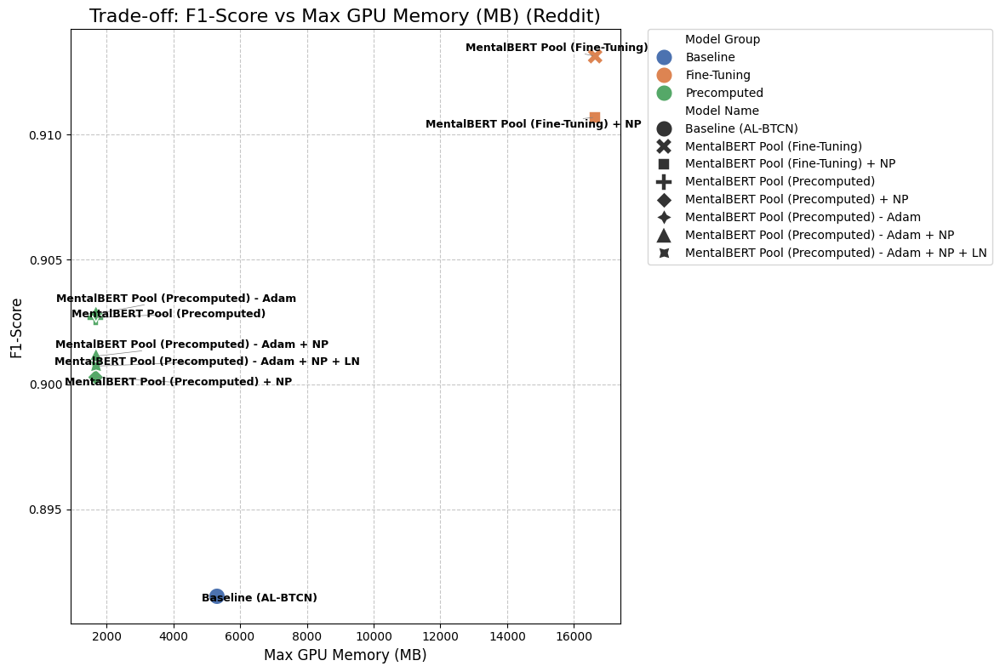

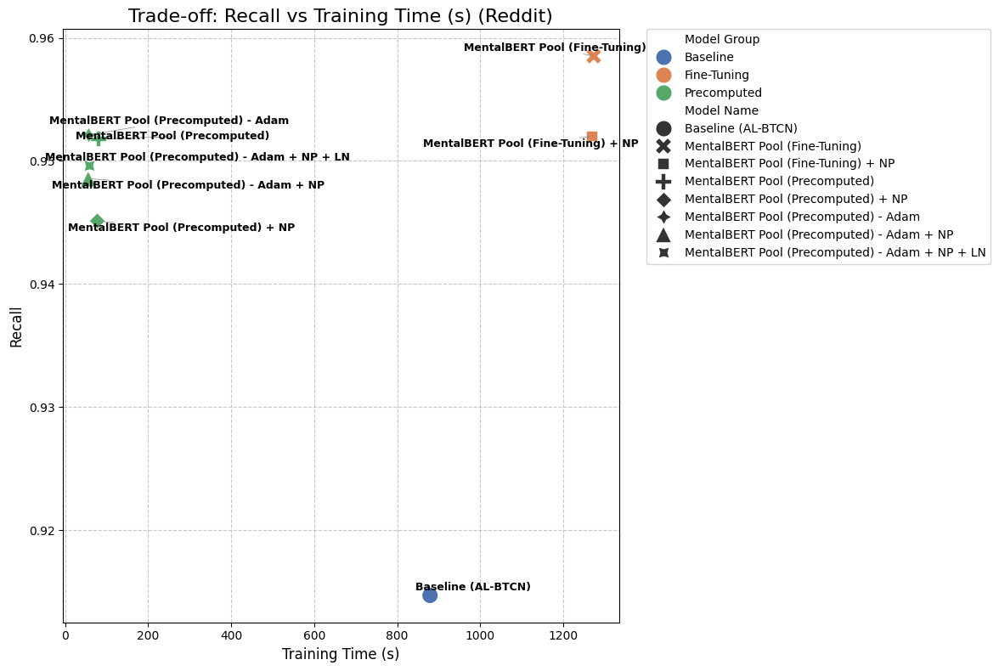

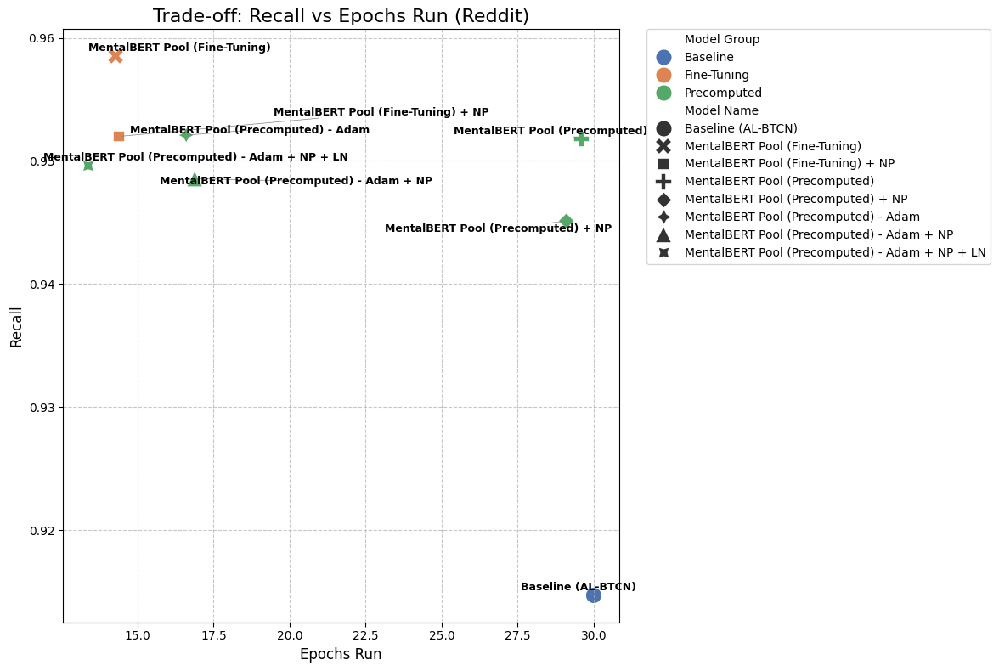

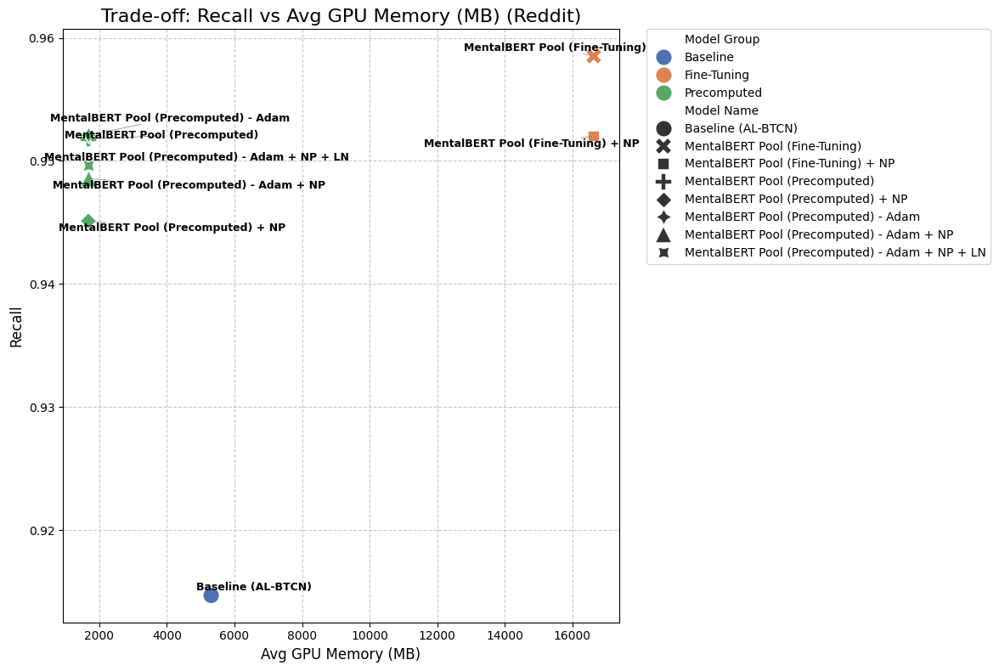

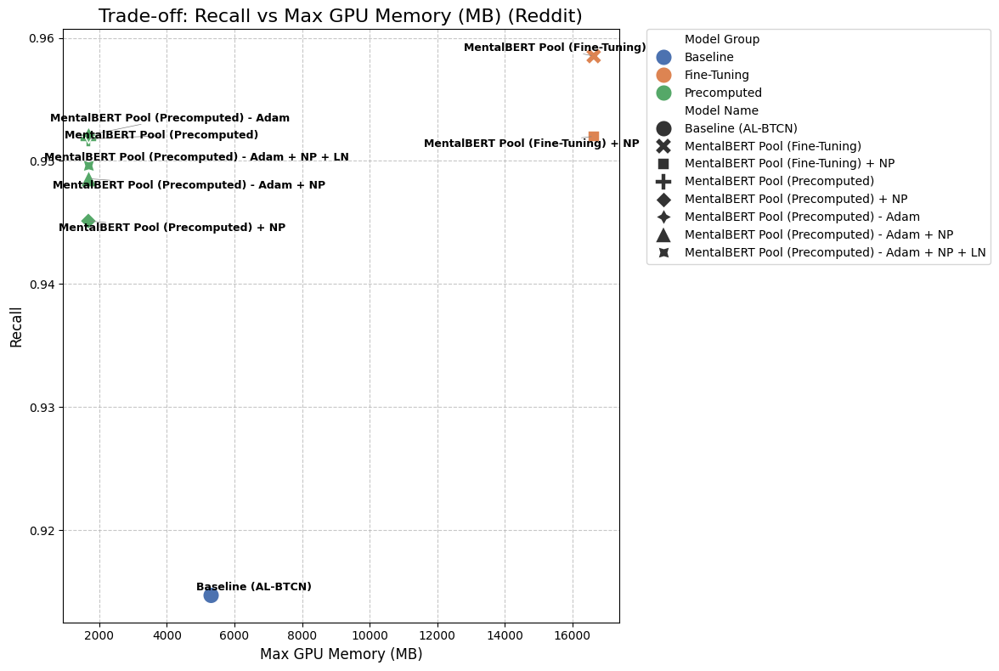

=== Trade-off Analysis for Twitter ===


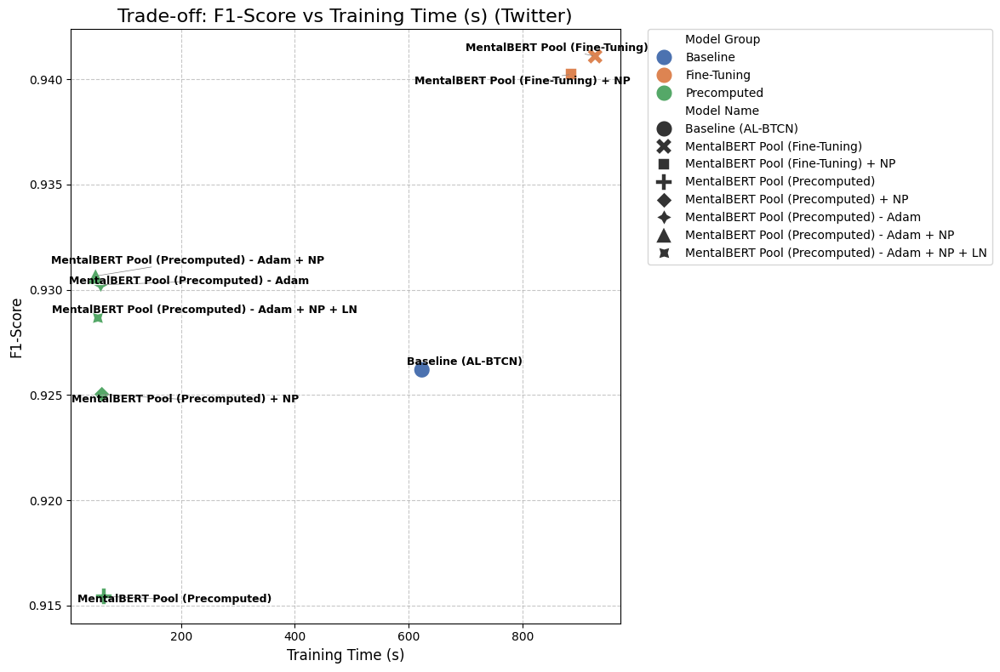

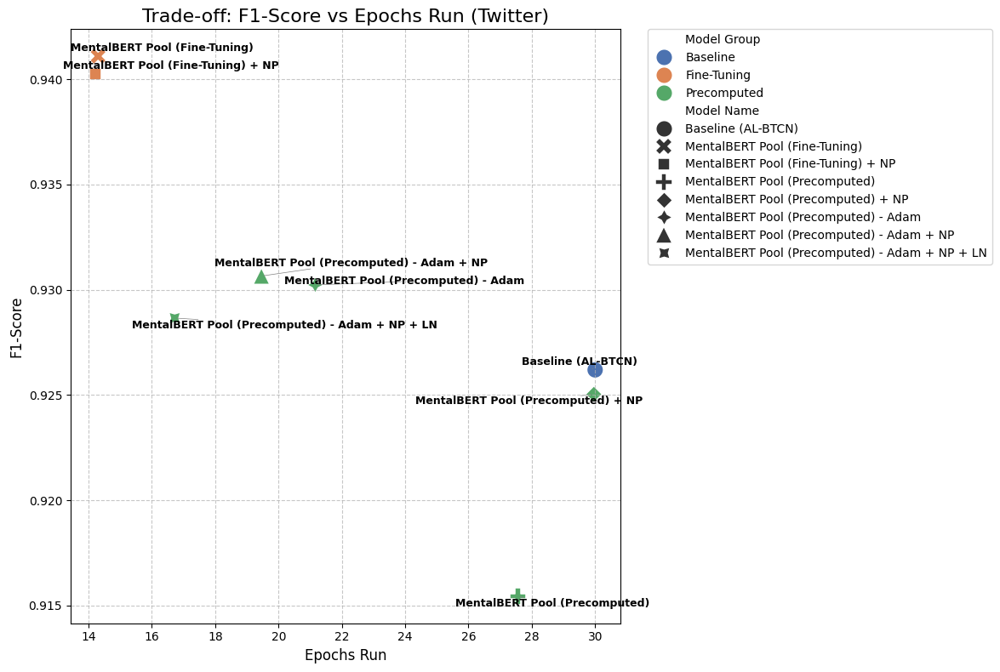

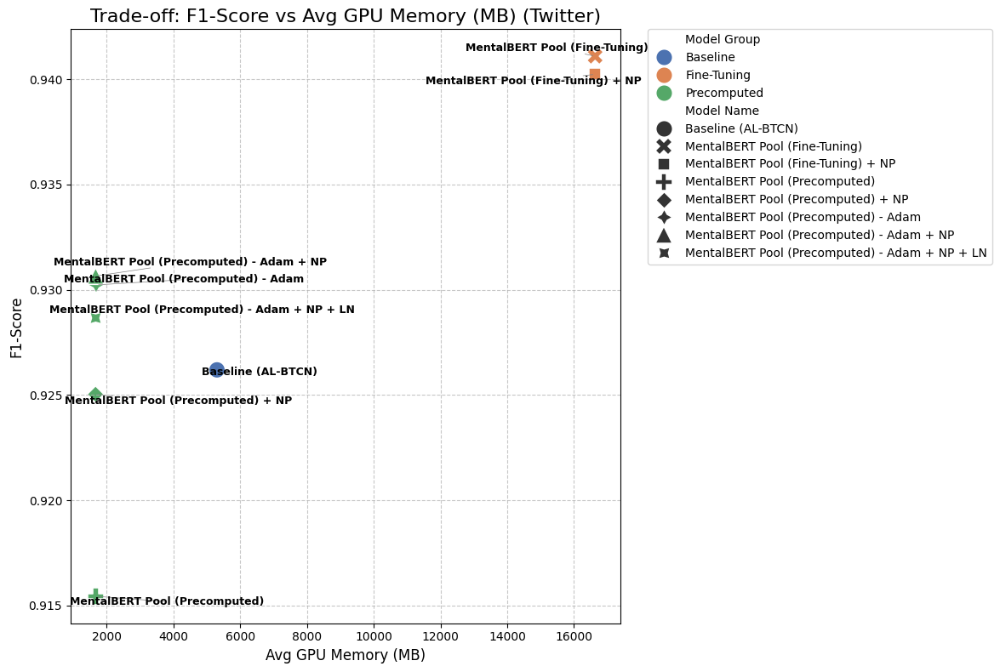

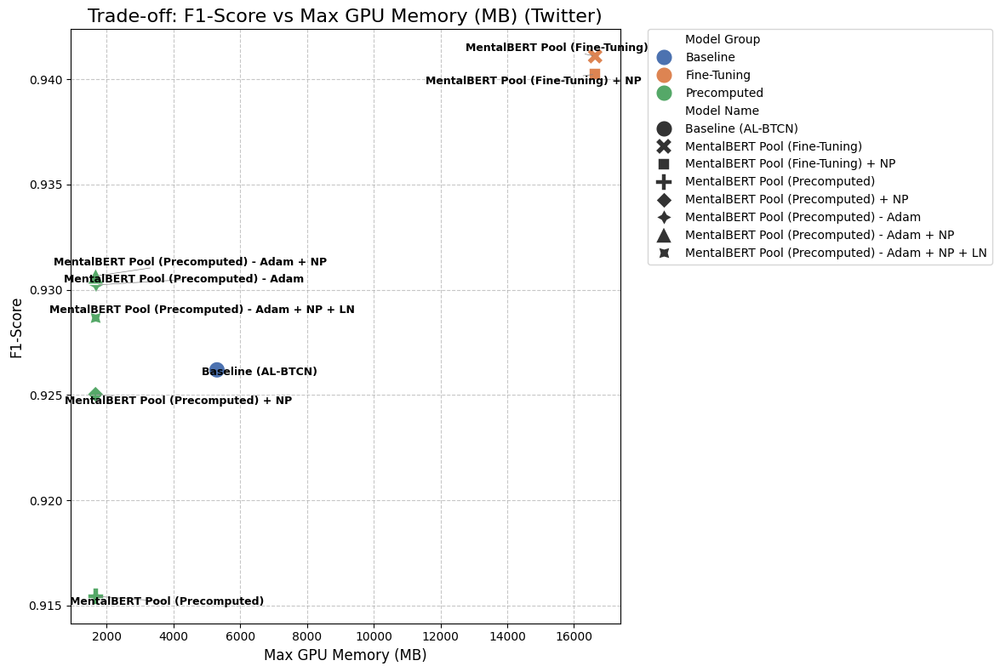

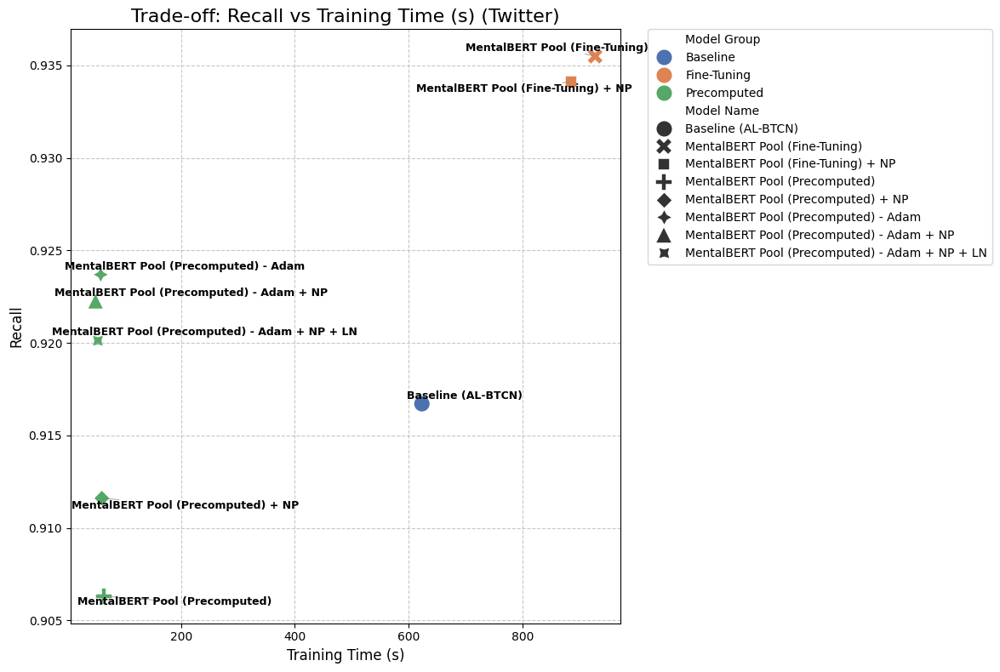

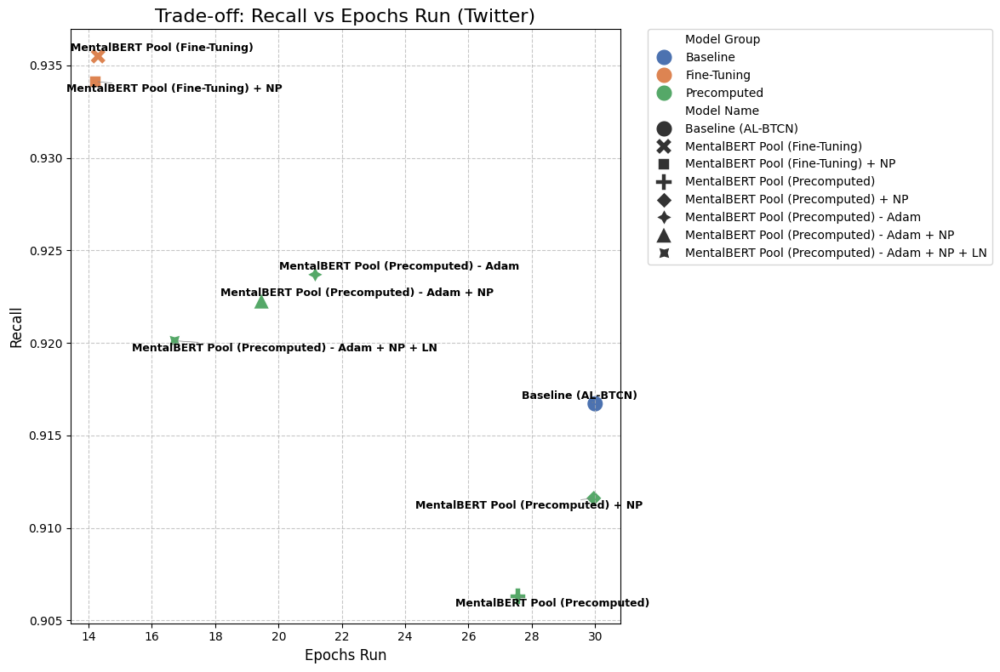

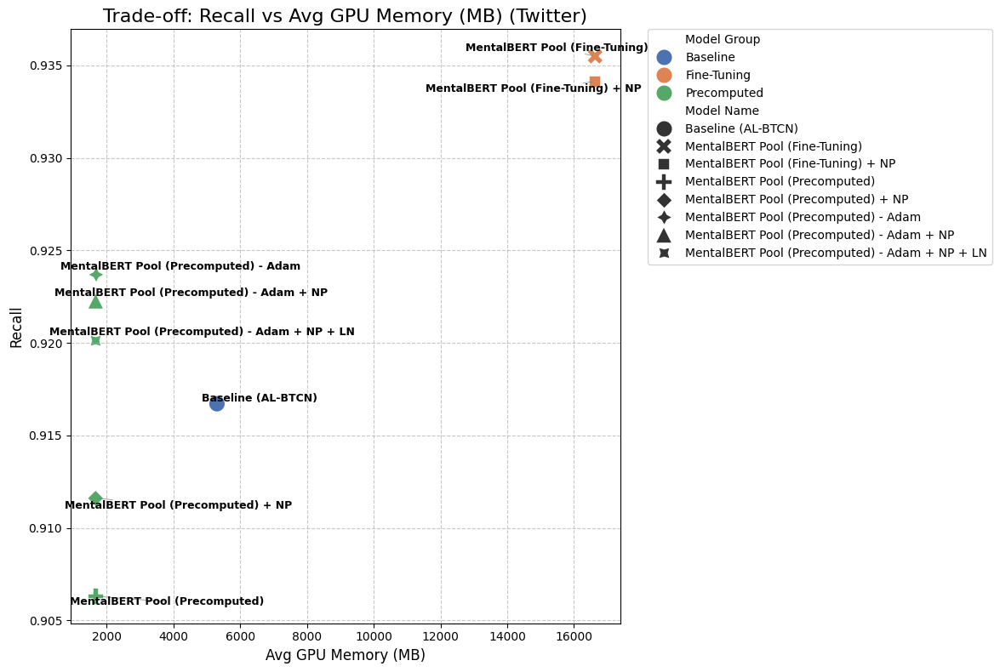

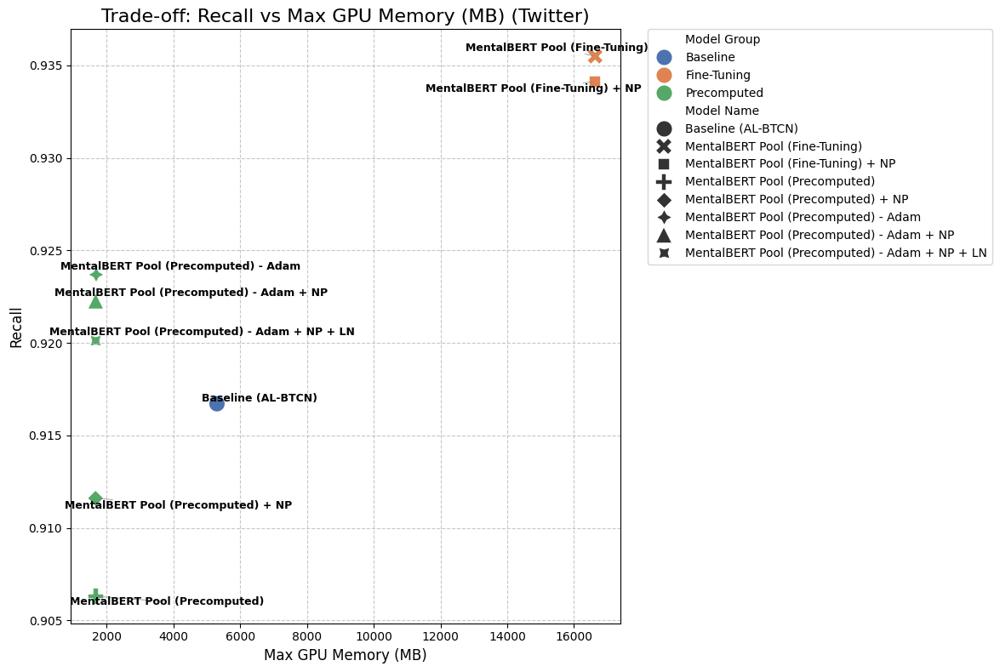

In [7]:
# Performance vs Efficiency Trade-off Analysis

# Define metrics for trade-off analysis
performance_metrics = ['F1-Score', 'Recall']
efficiency_metrics = ['Training Time (s)', 'Epochs Run', 'Avg GPU Memory (MB)', 'Max GPU Memory (MB)']

def plot_tradeoff(df, dataset_name, perf_metric, eff_metric):
    """
    Plots Performance vs Efficiency Trade-off using a scatter plot of means.
    """
    data = df[df['Dataset'] == dataset_name]
    if data.empty: return

    # Calculate means for each model
    summary = data.groupby('Model Name')[[perf_metric, eff_metric]].mean().reset_index()
    
    # Add Model Group info for coloring
    # We take the first occurrence of Model Group for each Model Name
    groups = data.groupby('Model Name')['Model Group'].first().reset_index()
    summary = pd.merge(summary, groups, on='Model Name')

    plt.figure(figsize=(12, 8))
    
    # Create scatter plot
    sns.scatterplot(
        data=summary,
        x=eff_metric,
        y=perf_metric,
        hue='Model Group',
        style='Model Name',
        s=200, # Marker size
        palette='deep'
    )
    
    # Annotate each point with Model Name
    texts = []
    for i, row in summary.iterrows():
        texts.append(plt.text(
            row[eff_metric], 
            row[perf_metric], 
            row['Model Name'], 
            fontsize=9,
            fontweight='bold'
        ))
    
    # Adjust text to avoid overlap
    try:
        from adjustText import adjust_text
        adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
    except ImportError:
        print("Warning: adjustText not installed. Labels may overlap. Run `pip install adjustText`.")

    plt.title(f'Trade-off: {perf_metric} vs {eff_metric} ({dataset_name})', fontsize=16)
    plt.xlabel(eff_metric, fontsize=12)
    plt.ylabel(perf_metric, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Move legend outside
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    
    plt.tight_layout()
    plt.show()

# Generate Trade-off Plots
for dataset in datasets:
    print(f"=== Trade-off Analysis for {dataset} ===")
    for perf in performance_metrics:
        for eff in efficiency_metrics:
            plot_tradeoff(full_df_v2, dataset, perf, eff)

=== Reddit ===

Statistical Analysis: Reddit - Accuracy
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0016
95% Confidence Interval: (-0.0029, -0.0003)
Cohen's d: -0.8653
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-2.7363, p-value=0.9885
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=4.0000, p-value=0.9951
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-2.7363, p-value=0.0230
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=4.0000, p-value=0.0137
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

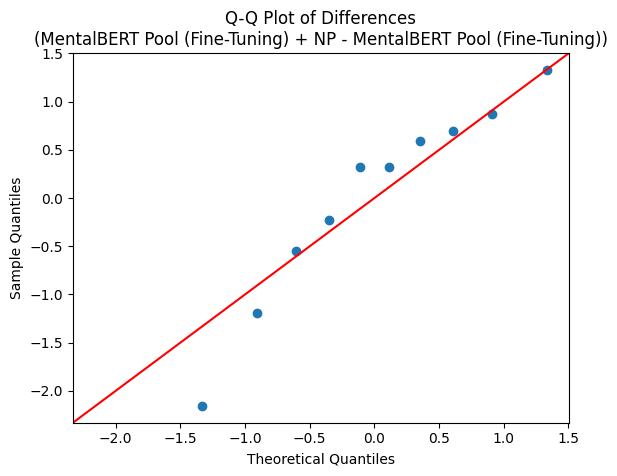


Statistical Analysis: Reddit - Precision
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0013
95% Confidence Interval: (-0.0055, 0.0081)
Cohen's d: 0.1342
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=0.4245, p-value=0.3406
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=32.0000, p-value=0.3477
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=0.4245, p-value=0.6812
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=23.0000, p-value=0.6953
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

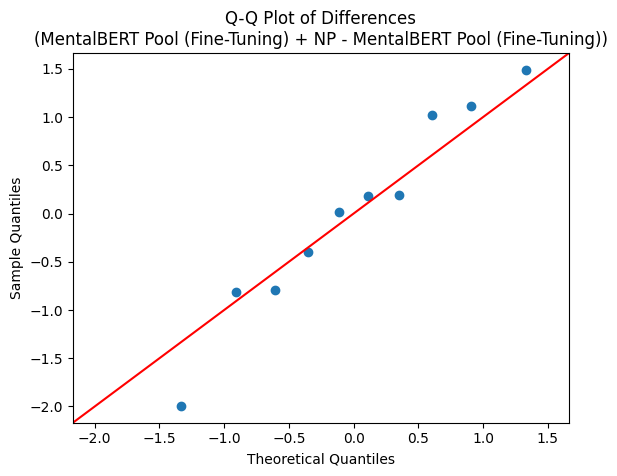


Statistical Analysis: Reddit - Recall
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0065
95% Confidence Interval: (-0.0167, 0.0037)
Cohen's d: -0.4575
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.4467, p-value=0.9091
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=11.0000, p-value=0.9580
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.4467, p-value=0.1819
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=11.0000, p-value=0.1055
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

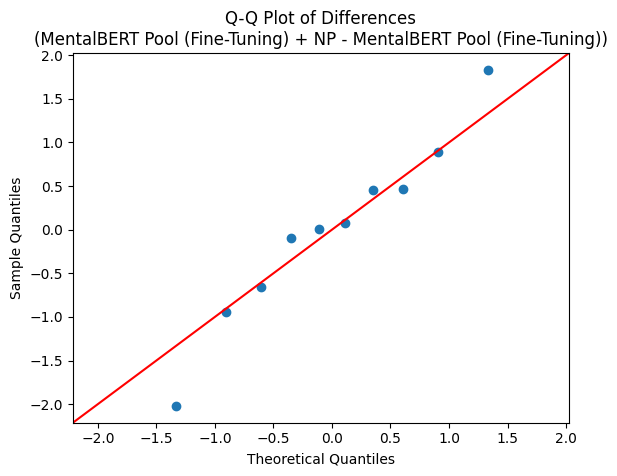


Statistical Analysis: Reddit - F1-Score
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0024
95% Confidence Interval: (-0.0040, -0.0009)
Cohen's d: -1.1137
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-3.5218, p-value=0.9968
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=0.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-3.5218, p-value=0.0065
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0020
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

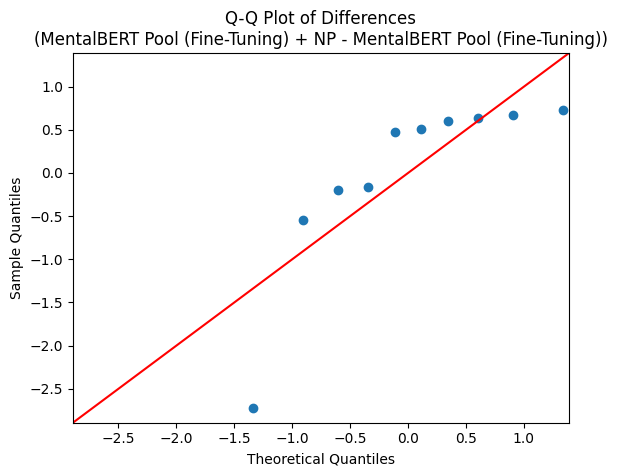


Statistical Analysis: Reddit - Accuracy
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0014
95% Confidence Interval: (-0.0027, -0.0001)
Cohen's d: -0.7578
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-2.3963, p-value=0.9799
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=10.0000, p-value=0.9678
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-2.3963, p-value=0.0401
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=10.0000, p-value=0.0840
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

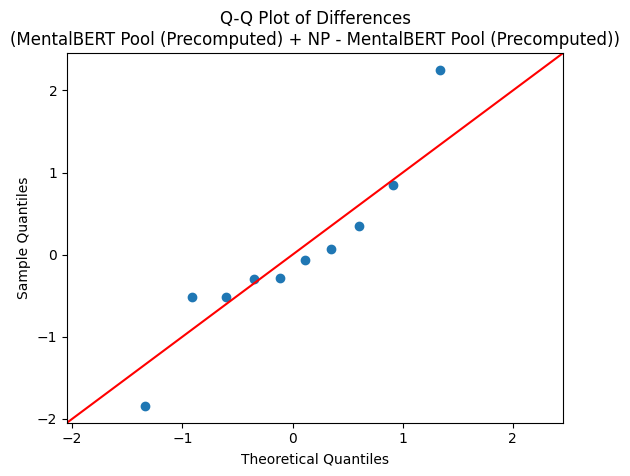


Statistical Analysis: Reddit - Precision
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0012
95% Confidence Interval: (-0.0042, 0.0065)
Cohen's d: 0.1588
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=0.5022, p-value=0.3138
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=31.0000, p-value=0.3848
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=0.5022, p-value=0.6276
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=24.0000, p-value=0.7695
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

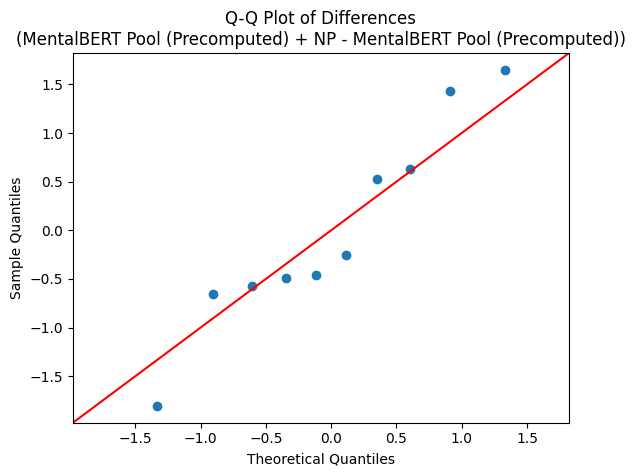


Statistical Analysis: Reddit - Recall
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0067
95% Confidence Interval: (-0.0151, 0.0018)
Cohen's d: -0.5653
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.7877, p-value=0.9463
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=8.0000, p-value=0.9814
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.7877, p-value=0.1075
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=8.0000, p-value=0.0488
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

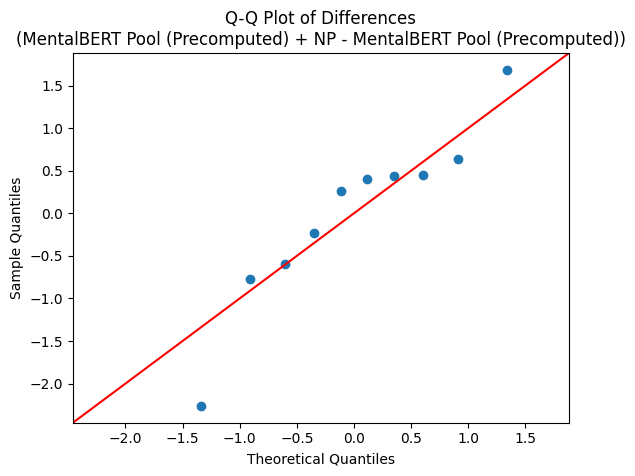


Statistical Analysis: Reddit - F1-Score
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0024
95% Confidence Interval: (-0.0039, -0.0009)
Cohen's d: -1.1122
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-3.5169, p-value=0.9967
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=1.0000, p-value=0.9990
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-3.5169, p-value=0.0065
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=1.0000, p-value=0.0039
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

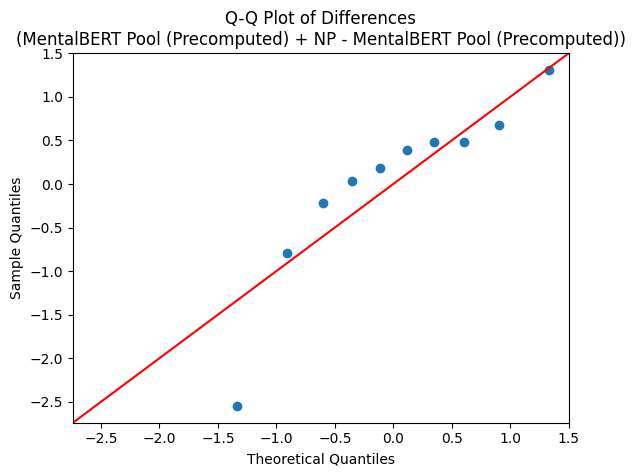


Statistical Analysis: Reddit - Accuracy
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0009
95% Confidence Interval: (-0.0019, 0.0000)
Cohen's d: -0.7052
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-2.2299, p-value=0.9736
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=11.0000, p-value=0.9580
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-2.2299, p-value=0.0527
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=11.0000, p-value=0.1055
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

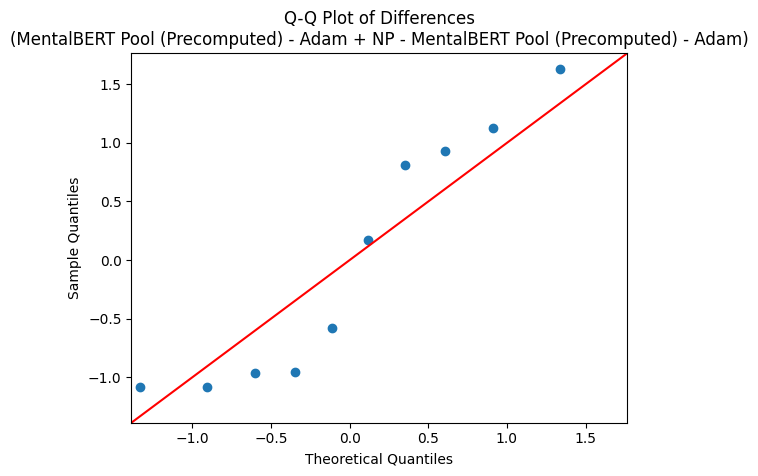


Statistical Analysis: Reddit - Precision
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0002
95% Confidence Interval: (-0.0030, 0.0026)
Cohen's d: -0.0418
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-0.1321, p-value=0.5511
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=22.0000, p-value=0.7217
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.1321, p-value=0.8978
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=22.0000, p-value=0.6250
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

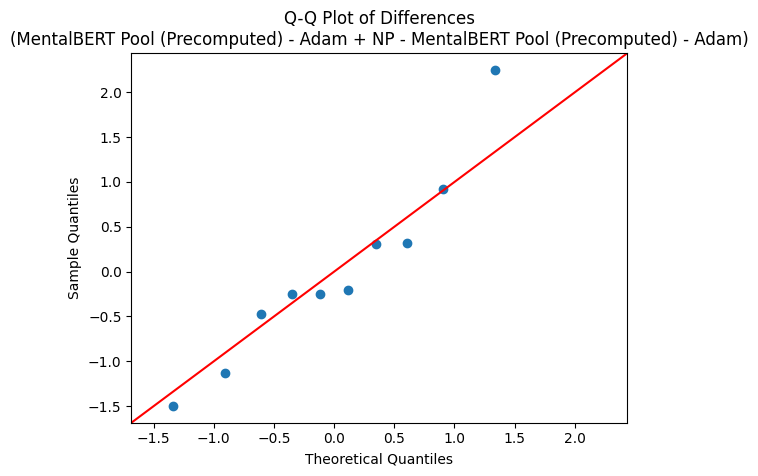


Statistical Analysis: Reddit - Recall
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0035
95% Confidence Interval: (-0.0077, 0.0006)
Cohen's d: -0.6076
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.9214, p-value=0.9566
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=11.0000, p-value=0.9580
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.9214, p-value=0.0869
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=11.0000, p-value=0.1055
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

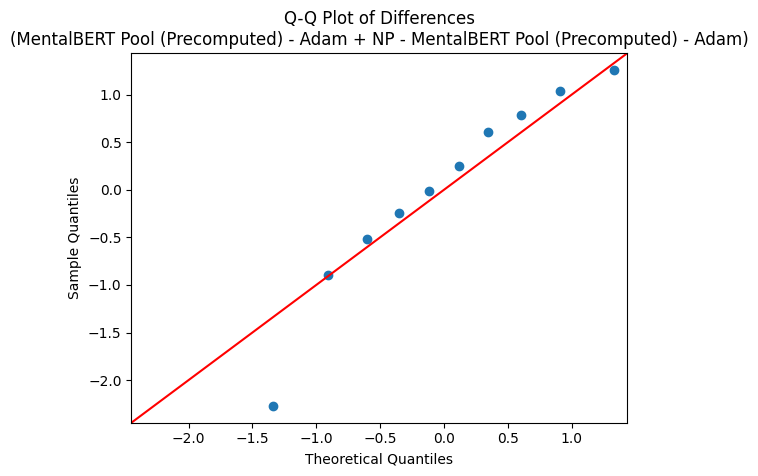


Statistical Analysis: Reddit - F1-Score
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0017
95% Confidence Interval: (-0.0026, -0.0008)
Cohen's d: -1.2918
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-4.0850, p-value=0.9986
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=3.0000, p-value=0.9971
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-4.0850, p-value=0.0027
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=3.0000, p-value=0.0098
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

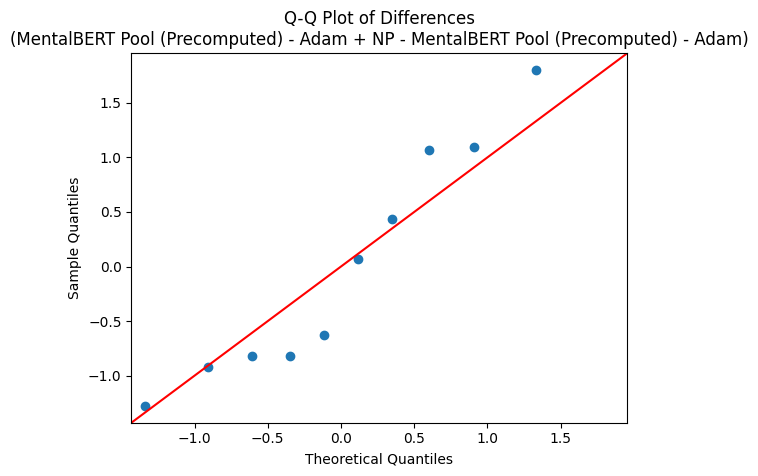


Statistical Analysis: Reddit - Accuracy
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0016
95% Confidence Interval: (-0.0025, -0.0006)
Cohen's d: -1.1601
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-3.6684, p-value=0.9974
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=4.0000, p-value=0.9951
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-3.6684, p-value=0.0052
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=4.0000, p-value=0.0137
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

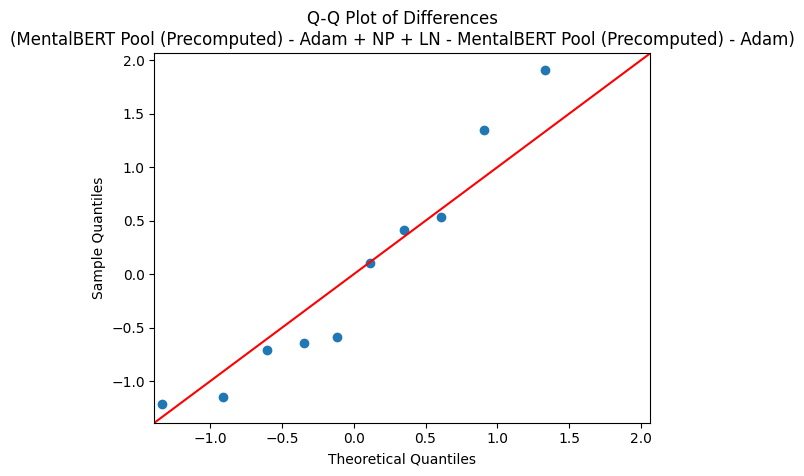


Statistical Analysis: Reddit - Precision
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0018
95% Confidence Interval: (-0.0048, 0.0012)
Cohen's d: -0.4192
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.3255, p-value=0.8912
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=16.0000, p-value=0.8838
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.3255, p-value=0.2177
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=16.0000, p-value=0.2754
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

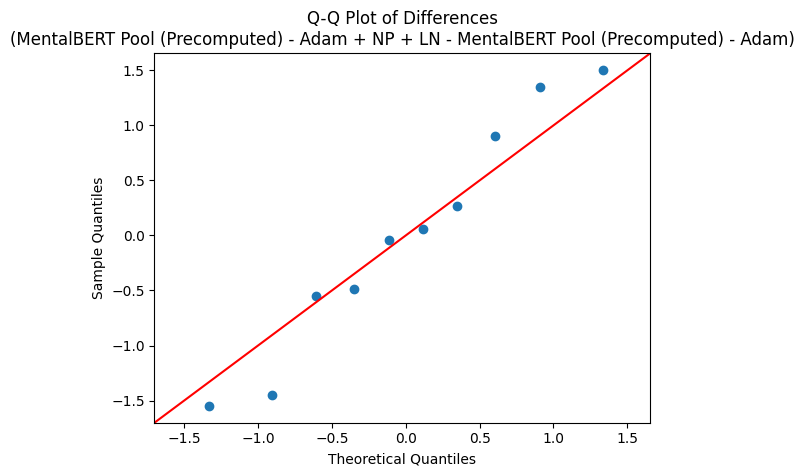


Statistical Analysis: Reddit - Recall
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0025
95% Confidence Interval: (-0.0057, 0.0007)
Cohen's d: -0.5511
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.7427, p-value=0.9423
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=13.0000, p-value=0.9346
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.7427, p-value=0.1154
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=13.0000, p-value=0.1602
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

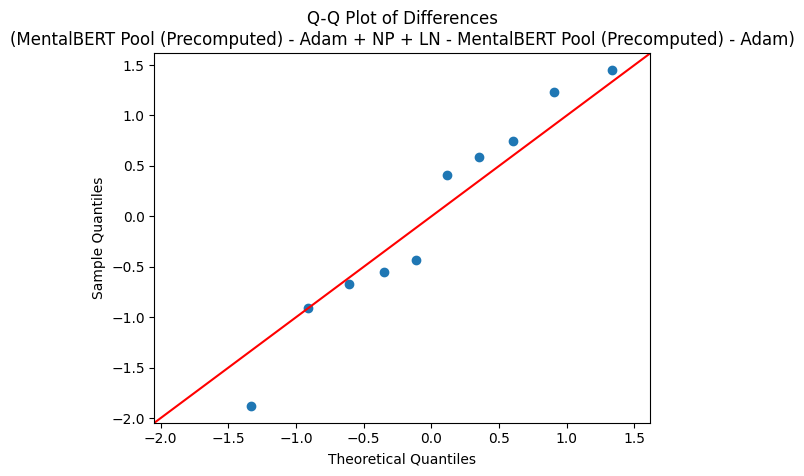


Statistical Analysis: Reddit - F1-Score
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0021
95% Confidence Interval: (-0.0028, -0.0014)
Cohen's d: -2.1012
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-6.6447, p-value=1.0000
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=0.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-6.6447, p-value=0.0001
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0020
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

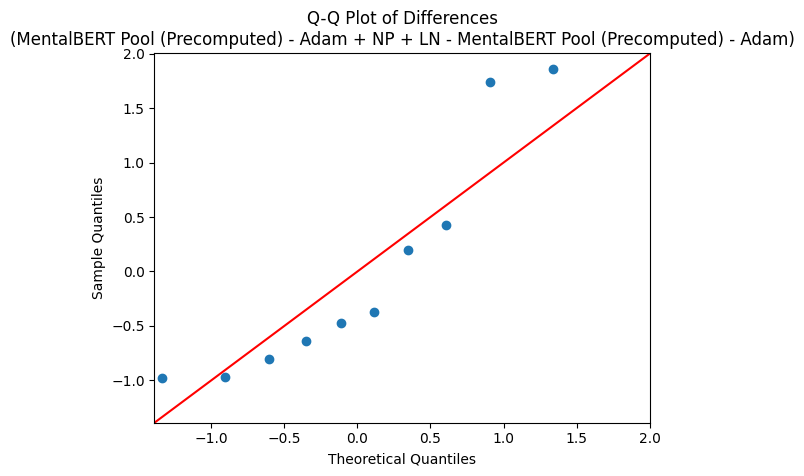

=== Twitter ===

Statistical Analysis: Twitter - Accuracy
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0022
95% Confidence Interval: (-0.0032, -0.0011)
Cohen's d: -1.4401
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-4.5541, p-value=0.9993
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=1.0000, p-value=0.9990
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-4.5541, p-value=0.0014
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=1.0000, p-value=0.0039
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

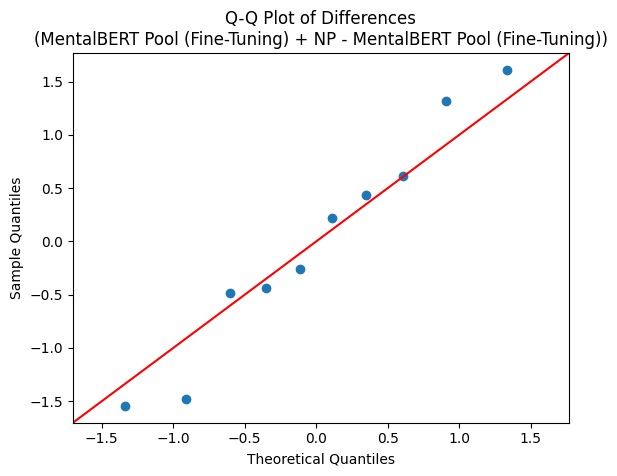


Statistical Analysis: Twitter - Precision
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0003
95% Confidence Interval: (-0.0063, 0.0056)
Cohen's d: -0.0389
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-0.1231, p-value=0.5476
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=27.0000, p-value=0.5391
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.1231, p-value=0.9047
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=27.0000, p-value=1.0000
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

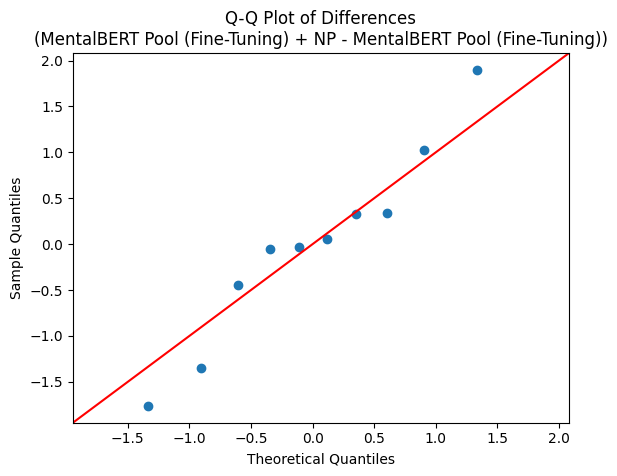


Statistical Analysis: Twitter - Recall
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0014
95% Confidence Interval: (-0.0077, 0.0050)
Cohen's d: -0.1540
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-0.4871, p-value=0.6811
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=27.0000, p-value=0.5391
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.4871, p-value=0.6379
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=27.0000, p-value=1.0000
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

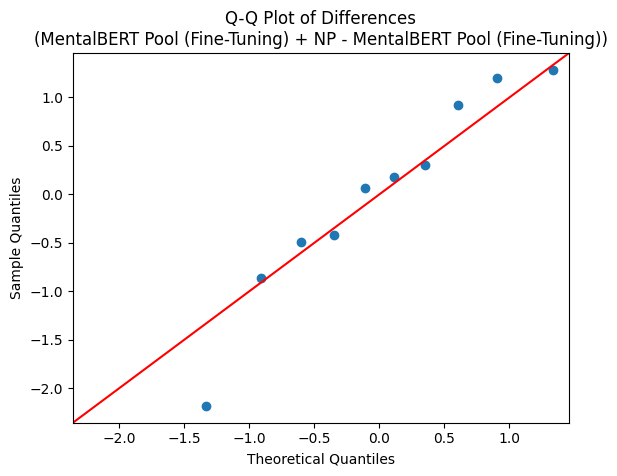


Statistical Analysis: Twitter - F1-Score
Comparing Experiment: 'MentalBERT Pool (Fine-Tuning) + NP' vs Control: 'MentalBERT Pool (Fine-Tuning)'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0009
95% Confidence Interval: (-0.0021, 0.0004)
Cohen's d: -0.5001
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.5815, p-value=0.9259
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=13.0000, p-value=0.9346
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.5815, p-value=0.1482
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=13.0000, p-value=0.1602
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

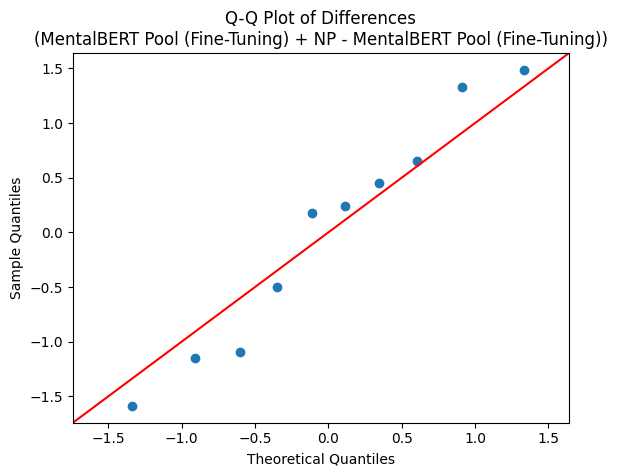


Statistical Analysis: Twitter - Accuracy
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0071
95% Confidence Interval: (0.0031, 0.0111)
Cohen's d: 1.2786
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=4.0433, p-value=0.0015
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=55.0000, p-value=0.0010
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=4.0433, p-value=0.0029
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0020
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

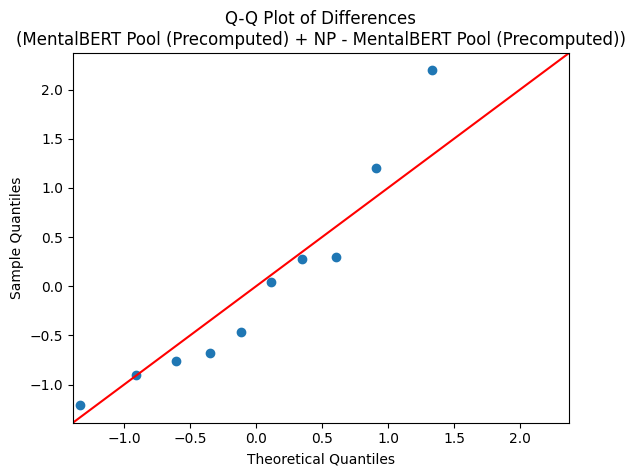


Statistical Analysis: Twitter - Precision
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0133
95% Confidence Interval: (0.0010, 0.0256)
Cohen's d: 0.7711
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=2.4384, p-value=0.0187
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=46.0000, p-value=0.0322
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=2.4384, p-value=0.0375
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=9.0000, p-value=0.0645
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

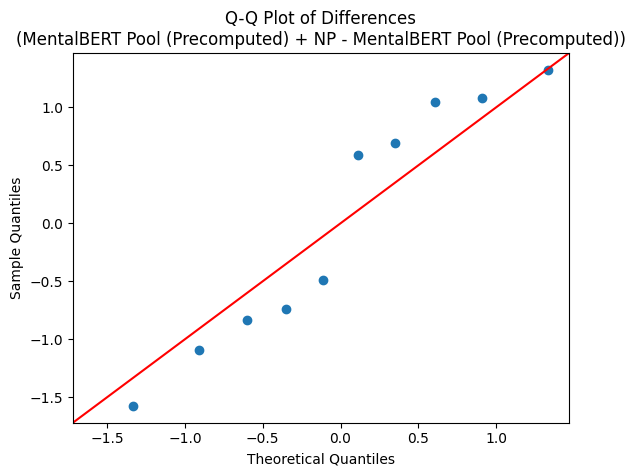


Statistical Analysis: Twitter - Recall
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0053
95% Confidence Interval: (-0.0070, 0.0176)
Cohen's d: 0.3077
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=0.9731, p-value=0.1780
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=36.0000, p-value=0.2158
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=0.9731, p-value=0.3559
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=19.0000, p-value=0.4316
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

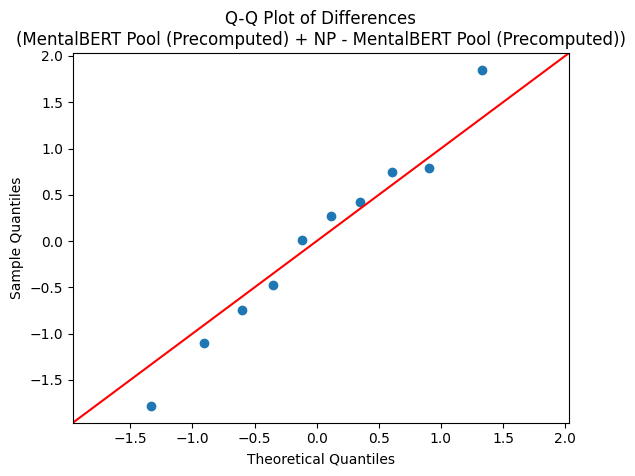


Statistical Analysis: Twitter - F1-Score
Comparing Experiment: 'MentalBERT Pool (Precomputed) + NP' vs Control: 'MentalBERT Pool (Precomputed)'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0096
95% Confidence Interval: (0.0054, 0.0138)
Cohen's d: 1.6512
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=5.2214, p-value=0.0003
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=55.0000, p-value=0.0010
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=5.2214, p-value=0.0005
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0020
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

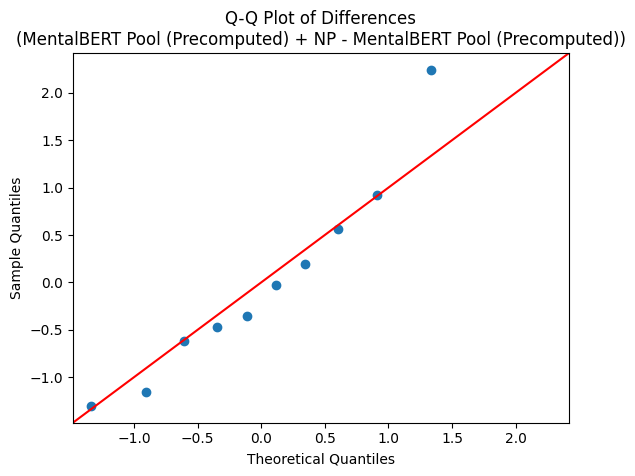


Statistical Analysis: Twitter - Accuracy
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0012
95% Confidence Interval: (-0.0030, 0.0006)
Cohen's d: -0.4617
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.4600, p-value=0.9109
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=16.0000, p-value=0.8838
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.4600, p-value=0.1783
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=16.0000, p-value=0.2754
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

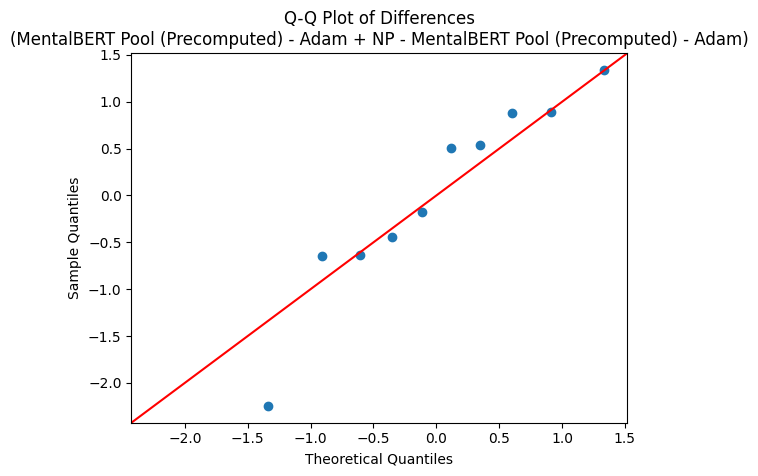


Statistical Analysis: Twitter - Precision
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0022
95% Confidence Interval: (-0.0039, 0.0083)
Cohen's d: 0.2593
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=0.8199, p-value=0.2167
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=34.0000, p-value=0.2783
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=0.8199, p-value=0.4334
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=21.0000, p-value=0.5566
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

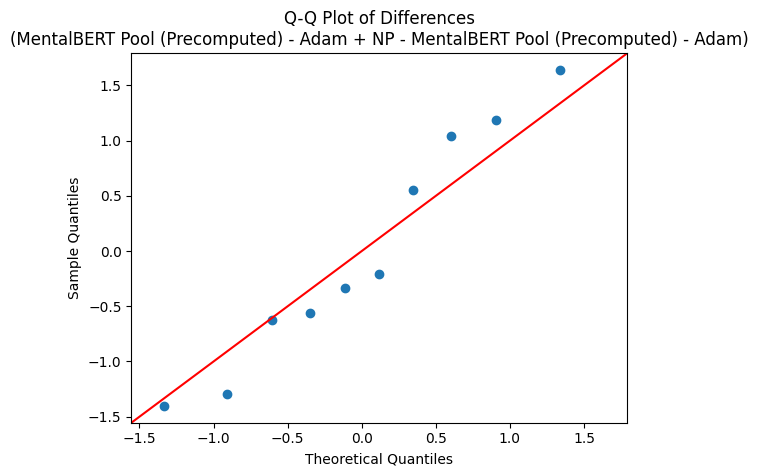


Statistical Analysis: Twitter - Recall
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0014
95% Confidence Interval: (-0.0057, 0.0029)
Cohen's d: -0.2378
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-0.7520, p-value=0.7644
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=19.0000, p-value=0.8125
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.7520, p-value=0.4713
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=19.0000, p-value=0.4316
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

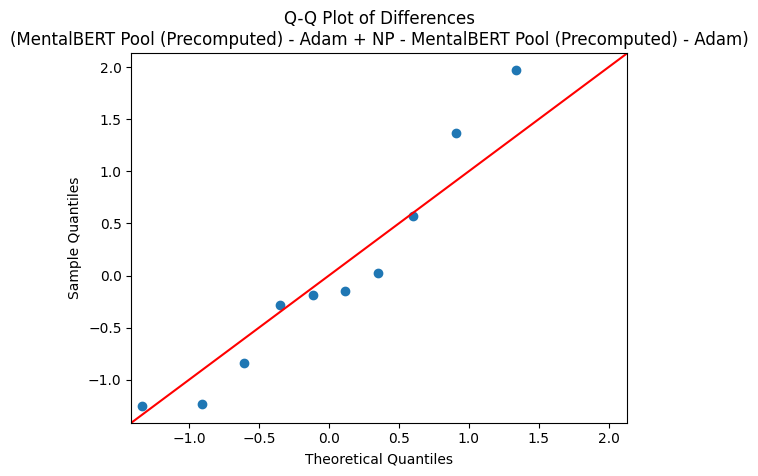


Statistical Analysis: Twitter - F1-Score
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0004
95% Confidence Interval: (-0.0015, 0.0023)
Cohen's d: 0.1592
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=0.5033, p-value=0.3134
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=35.0000, p-value=0.2461
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=0.5033, p-value=0.6268
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=20.0000, p-value=0.4922
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

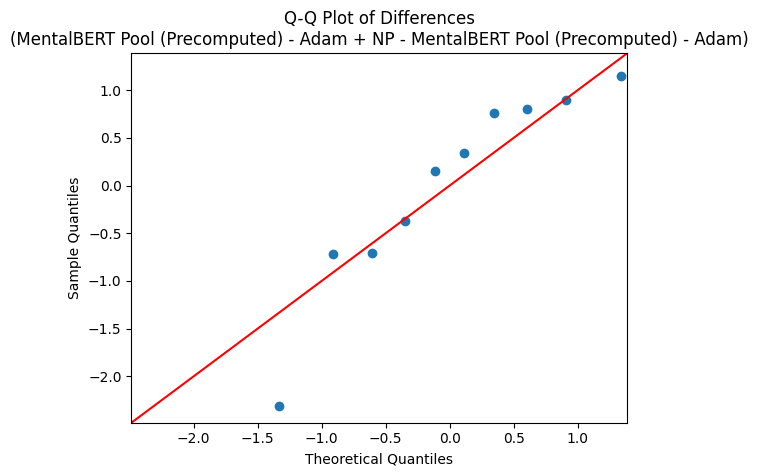


Statistical Analysis: Twitter - Accuracy
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0030
95% Confidence Interval: (-0.0045, -0.0015)
Cohen's d: -1.4118
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-4.4645, p-value=0.9992
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=2.0000, p-value=0.9980
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-4.4645, p-value=0.0016
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=2.0000, p-value=0.0059
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

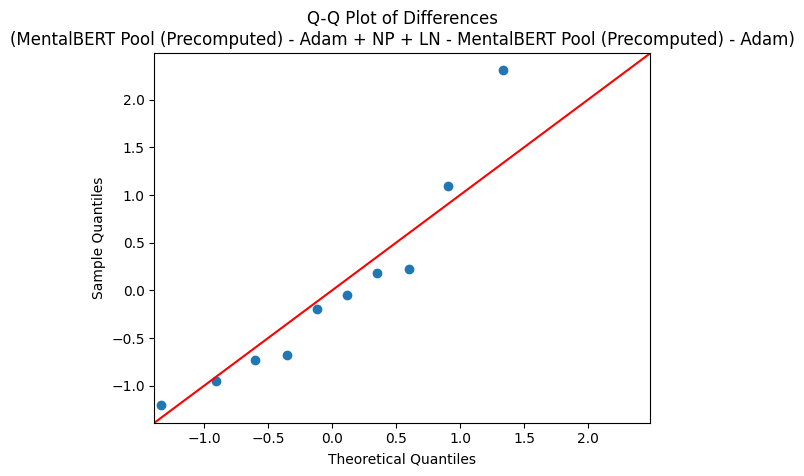


Statistical Analysis: Twitter - Precision
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): 0.0006
95% Confidence Interval: (-0.0051, 0.0062)
Cohen's d: 0.0730
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=0.2308, p-value=0.4113
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=32.0000, p-value=0.3477
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=0.2308, p-value=0.8226
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=23.0000, p-value=0.6953
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

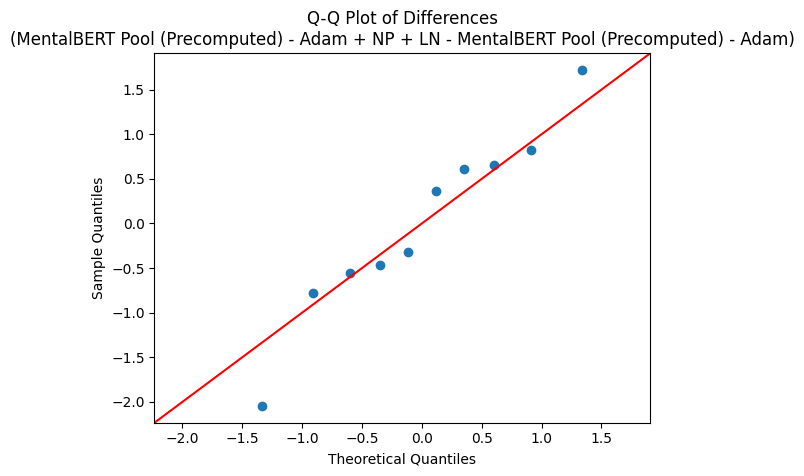


Statistical Analysis: Twitter - Recall
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0036
95% Confidence Interval: (-0.0085, 0.0014)
Cohen's d: -0.5186
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-1.6400, p-value=0.9323
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=13.0000, p-value=0.9346
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.6400, p-value=0.1354
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=13.0000, p-value=0.1602
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

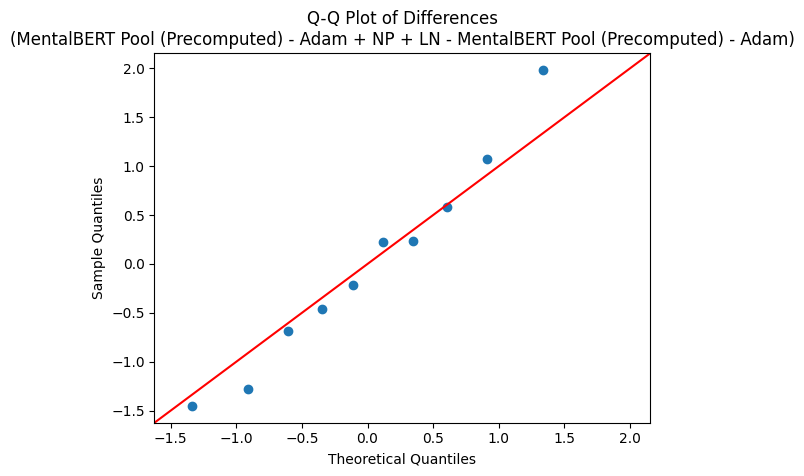


Statistical Analysis: Twitter - F1-Score
Comparing Experiment: 'MentalBERT Pool (Precomputed) - Adam + NP + LN' vs Control: 'MentalBERT Pool (Precomputed) - Adam'
Number of Seeds: 10
Mean Difference (Experiment - Control): -0.0016
95% Confidence Interval: (-0.0032, 0.0000)
Cohen's d: -0.7105
Alternative Hypothesis: Experiment greater than Control
Paired T-Test: t-statistic=-2.2469, p-value=0.9744
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=9.0000, p-value=0.9756
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Experiment != Control (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-2.2469, p-value=0.0513
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=9.0000, p-value=0.0645
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

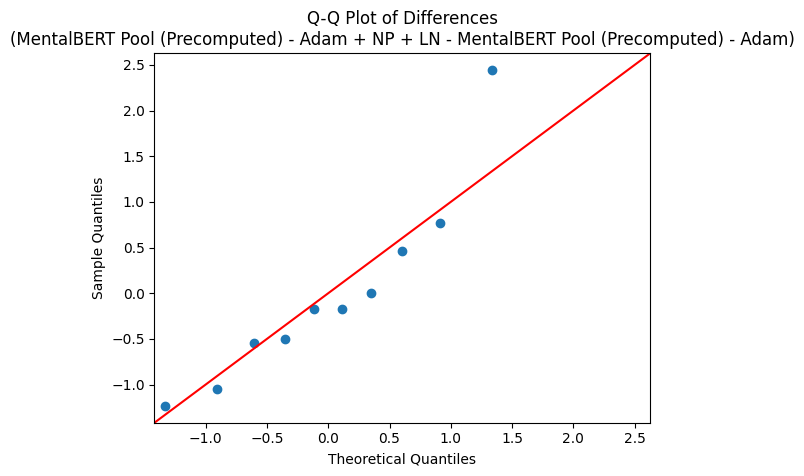

Results saved to c:\Files\Degree\FYP\FYP_ver5\Results\10seeds_cv5_runs\3_Test_AlternativePreprocessing\statistical_analysis_results_np.xlsx
  Dataset     Metric                    Experiment Model  \
0  Reddit   Accuracy  MentalBERT Pool (Fine-Tuning) + NP   
1  Reddit  Precision  MentalBERT Pool (Fine-Tuning) + NP   
2  Reddit     Recall  MentalBERT Pool (Fine-Tuning) + NP   
3  Reddit   F1-Score  MentalBERT Pool (Fine-Tuning) + NP   
4  Reddit   Accuracy  MentalBERT Pool (Precomputed) + NP   

                   Control Model  Num Seeds  Mean Difference  CI Lower  \
0  MentalBERT Pool (Fine-Tuning)         10        -0.001580 -0.002887   
1  MentalBERT Pool (Fine-Tuning)         10         0.001281 -0.005547   
2  MentalBERT Pool (Fine-Tuning)         10        -0.006516 -0.016704   
3  MentalBERT Pool (Fine-Tuning)         10        -0.002443 -0.004013   
4  MentalBERT Pool (Precomputed)         10        -0.001398 -0.002718   

   CI Upper  Cohens d  T-Test (1-sided) p-val T-Test (

In [8]:
import scipy.stats as stats
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import os

def perform_detailed_statistical_analysis(df, dataset_name, metric, model_experiment, model_control, results_list=None):
    print(f"\n{'='*20}\nStatistical Analysis: {dataset_name} - {metric}\n{'='*20}")
    print(f"Comparing Experiment: '{model_experiment}' vs Control: '{model_control}'")
    
    # Filter data
    data = df[df['Dataset'] == dataset_name]
    if data.empty:
        print(f"No data for {dataset_name}")
        return

    # 1. Average for each seed first
    # Group by Model and Seed to get the mean of the metric for that seed (across folds)
    seed_avg = data.groupby(['Model Name', 'Seed'])[metric].mean().reset_index()
    
    # Pivot to get models as columns, seeds as index
    pivot_df = seed_avg.pivot(index='Seed', columns='Model Name', values=metric)
    
    if model_experiment not in pivot_df.columns or model_control not in pivot_df.columns:
        print(f"One or both models not found in data: {model_experiment}, {model_control}")
        return
    
    # Ensure we have paired data (same seeds)
    # Drop NA if any seed is missing for one of the pair
    pair_df = pd.concat([pivot_df[model_control], pivot_df[model_experiment]], axis=1).dropna()
    if len(pair_df) < 2:
        print(f"Not enough data points for comparison.")
        return
        
    diff = pair_df[model_experiment] - pair_df[model_control]
    n = len(diff)
    mean_diff = diff.mean()
    std_diff = diff.std(ddof=1)
    
    print(f"Number of Seeds: {n}")
    print(f"Mean Difference (Experiment - Control): {mean_diff:.4f}")
    
    alpha = 0.05
    
    # Confidence Interval (95%)
    se = std_diff / np.sqrt(n)
    ci = stats.t.interval(1 - alpha, df=n-1, loc=mean_diff, scale=se)
    print(f"95% Confidence Interval: ({ci[0]:.4f}, {ci[1]:.4f})")
    
    # Cohen's d (for paired samples)
    if std_diff != 0:
        cohens_d = mean_diff / std_diff
    else:
        cohens_d = 0
    print(f"Cohen's d: {cohens_d:.4f}")
    
    # Determine direction
    higher_is_better = 'Time' not in metric and 'Memory' not in metric and 'Epochs' not in metric
    alt_hyp = 'greater' if higher_is_better else 'less'
    
    # --- One-Sided Test (Improvement) ---
    print(f"Alternative Hypothesis: Experiment {alt_hyp} than Control")

    # Paired T-Test
    t_stat, p_val_t = stats.ttest_rel(pair_df[model_experiment], pair_df[model_control], alternative=alt_hyp)
    print(f"Paired T-Test: t-statistic={t_stat:.4f}, p-value={p_val_t:.4f}")
    
    t_test_result = "Reject H0 (Significant Improvement)" if p_val_t < alpha else "Fail to reject H0"
    if p_val_t < alpha:
        print(f"Result (T-Test): {t_test_result} - {alt_hyp}")
    else:
        print(f"Result (T-Test): {t_test_result}")
    
    # Wilcoxon Signed-Rank Test
    w_stat, p_val_w = np.nan, np.nan
    wilcoxon_result = "N/A"
    try:
        w_stat, p_val_w = stats.wilcoxon(pair_df[model_experiment], pair_df[model_control], alternative=alt_hyp)
        print(f"Wilcoxon Test: statistic={w_stat:.4f}, p-value={p_val_w:.4f}")
        wilcoxon_result = "Reject H0 (Significant Improvement)" if p_val_w < alpha else "Fail to reject H0"
        if p_val_w < alpha:
            print(f"Result (Wilcoxon): {wilcoxon_result} - {alt_hyp}")
        else:
            print(f"Result (Wilcoxon): {wilcoxon_result}")
    except Exception as e:
        print(f"Wilcoxon Test Failed: {e}")

    # --- Two-Sided Test (Any Difference) ---
    print("-" * 20)
    print(f"Alternative Hypothesis: Experiment != Control (Two-Sided)")

    # Paired T-Test (Two-Sided)
    t_stat_2, p_val_t_2 = stats.ttest_rel(pair_df[model_experiment], pair_df[model_control], alternative='two-sided')
    print(f"Paired T-Test (Two-Sided): t-statistic={t_stat_2:.4f}, p-value={p_val_t_2:.4f}")
    
    t_test_result_2 = "Reject H0 (Significant Difference)" if p_val_t_2 < alpha else "Fail to reject H0"
    if p_val_t_2 < alpha:
        print("Result (T-Test Two-Sided): Reject H0 (Significant Difference)")
    else:
        print("Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)")

    # Wilcoxon Signed-Rank Test (Two-Sided)
    w_stat_2, p_val_w_2 = np.nan, np.nan
    wilcoxon_result_2 = "N/A"
    try:
        w_stat_2, p_val_w_2 = stats.wilcoxon(pair_df[model_experiment], pair_df[model_control], alternative='two-sided')
        print(f"Wilcoxon Test (Two-Sided): statistic={w_stat_2:.4f}, p-value={p_val_w_2:.4f}")
        wilcoxon_result_2 = "Reject H0 (Significant Difference)" if p_val_w_2 < alpha else "Fail to reject H0"
        if p_val_w_2 < alpha:
            print("Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)")
        else:
            print("Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)")
    except Exception as e:
        print(f"Wilcoxon Test (Two-Sided) Failed: {e}")

    # Q-Q Plot
    plt.figure(figsize=(6, 4))
    sm.qqplot(diff, line='45', fit=True)
    plt.title(f'Q-Q Plot of Differences\n({model_experiment} - {model_control})')
    plt.show()

    if results_list is not None:
        results_list.append({
            'Dataset': dataset_name,
            'Metric': metric,
            'Experiment Model': model_experiment,
            'Control Model': model_control,
            'Num Seeds': n,
            'Mean Difference': mean_diff,
            'CI Lower': ci[0],
            'CI Upper': ci[1],
            'Cohens d': cohens_d,
            'T-Test (1-sided) p-val': p_val_t,
            'T-Test (1-sided) Result': t_test_result,
            'Wilcoxon (1-sided) p-val': p_val_w,
            'Wilcoxon (1-sided) Result': wilcoxon_result,
            'T-Test (2-sided) p-val': p_val_t_2,
            'T-Test (2-sided) Result': t_test_result_2,
            'Wilcoxon (2-sided) p-val': p_val_w_2,
            'Wilcoxon (2-sided) Result': wilcoxon_result_2
        })

# Define Pairs (Experiment, Control)
# We hypothesize Experiment > Control (for metrics like F1, Recall)
pairs_to_test = [
    ('MentalBERT Pool (Fine-Tuning) + NP', 'MentalBERT Pool (Fine-Tuning)'),
    ('MentalBERT Pool (Precomputed) + NP', 'MentalBERT Pool (Precomputed)'),
    ('MentalBERT Pool (Precomputed) - Adam + NP', 'MentalBERT Pool (Precomputed) - Adam'),
    ('MentalBERT Pool (Precomputed) - Adam + NP + LN', 'MentalBERT Pool (Precomputed) - Adam')
]

metrics_for_test = ['Accuracy','Precision','Recall','F1-Score']
all_stats_results = []

for dataset in datasets:
    print(f"=== {dataset} ===")
    for model_exp, model_ctrl in pairs_to_test:
        for metric in metrics_for_test:
            perform_detailed_statistical_analysis(full_df_v2, dataset, metric, model_exp, model_ctrl, all_stats_results)

# Save to Excel
if all_stats_results:
    results_df = pd.DataFrame(all_stats_results)
    # path_np is defined in the first cell of the notebook
    output_file = os.path.join(path_np, 'statistical_analysis_results_np.xlsx')
    results_df.to_excel(output_file, index=False)
    print(f"Results saved to {output_file}")
    print(results_df.head())